<a class="anchor" id="0.1"></a>

# **DM Project Insurance Company - Table of Contents**

* [<font color='#E8800A'>1 - Business Needs </font>](#first-bullet) <br>
* [<font color='#E8800A'>2 - Data Integration </font>](#second-bullet) <br>
    - 2.1. Importing Libraries <br>
* [<font color='#E8800A'>3 - Data Exploration and Analysis </font>](#third-bullet) <br>
    - 3.1. Checking for missing values and duplicates  <br>
    - 3.2. Data Vizualisation <br>
    - 3.3. Checking for outliers using boxplots <br>
    - 3.4. Checking variables' correlations <br>
* [<font color='#E8800A'>4 - Data Cleansing and Preprocessing </font>](#forth-bullet) <br>
    - 4.1. Coherence Check <br>
    - 4.2. Dealing with missing values <br>
    - 4.3. Fiw Wrong Types <br>
    - 4.4. Dealing with Outlier and visualization <br>
    - 4.5. Feature Engineering <br>
    - 4.6. Feature Selection <br>
    - 4.7. Data Normalization <br>
    - 4.8. One hot encoding <br>
    - 4.9. PCA <br>
* [<font color='#E8800A'>5 - Clustering </font>](#fifth-bullet) <br>
    - 5.1. Hierarchical Clustering <br>
    - 5.2. Kmeans <br>
    - 5.3. Self Organizing Maps <br>
    - 5.4. SOM + Kmeans <br>
    - 5.5. Density based Clustering <br>

<a class="anchor" id="first-bullet">     

# 1. Business Needs
    
</a>
</div>

As a Data Mining/Analytic Consultant, you are asked develop a Customer Segmentation in such a way that it
will be possible for the Marketing Department to better understand all the different Customers’ Profiles. <br>
You are expected to define, describe and explain the clusters you chose.<br> Invest time in reasoning how you want
to do your clustering, possible approaches, and advantages or disadvantages of different decisions.<br>
Simultaneous, you should express the marketing approach you recommend for each cluster

<a class="anchor" id="1.1">

### Metadata
<hr>

ID: ID <br>
First Policy :  Year of the customer’s first policy (May be considered as the first year as a customer)<br>
Birthday :  Customer’s Birthday Year (The current year of the database is 2016 )<br>
Education :  Academic Degree<br>
Salary :   Gross monthly salary (€)<br>
Area :  Living area (No further information provided about the meaning of the area codes)<br>
Children :  Binary variable (Y=1)<br>
CMV :   Customer Monetary Value (Lifetime value = (annual profit from the customer) X (number of yearsthat they are a customer) 
(acquisition cost))<br>
ClaimsRate :   Claims Rate (Amount paid by the insurance company (€)/ Premiums (€) Note: in the last 2 years) <br>
PremMotor	:  Premiums (€) in LOB: Motor<br>
PremHousehold	:Premiums (€) in LOB: Household<br>
PremHealth : Premiums (€) in LOB: Health<br>
PremLife	: Premiums (€) in LOB: Life<br>
PremWork : Premiums (€) in LOB: Work Compensations<br><br>
 <b>NB : Annual Premiums (2016) Negative premiums may manifest reversals occurred in the current year, paid in previous one(s)</b>


<a class="anchor" id="second-bullet">     

# 2. Data Integration
    
</a>
</div>

In [1]:
# import pandas as pd
# import pyarrow as pa
# import pyarrow.parquet as pq
from sas7bdat import SAS7BDAT
import numpy as np
import seaborn as sns
import pandas as pd
import numpy as np
import scipy as sp
import seaborn as sns
import matplotlib.pyplot as plt
import statsmodels as sm
import os
from zipfile import ZipFile
# Remember: library imports are ALWAYS at the top of the script, no exceptions!
import sqlite3
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from math import ceil
from sklearn.preprocessing import MinMaxScaler, StandardScaler, OneHotEncoder,RobustScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, silhouette_samples
import matplotlib.cm as cm
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram
# notice we are adding two new imports for visualizations; This was not here last class
from itertools import product
from pandas_profiling import ProfileReport
from sklearn.impute import KNNImputer
import warnings

warnings.filterwarnings('ignore')
from os.path import join
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from sklearn.neighbors import NearestNeighbors
from sklearn.mixture import GaussianMixture
from sklearn.cluster import MeanShift, DBSCAN, estimate_bandwidth
%matplotlib inline
from sklearn.decomposition import PCA

# for better resolution plots
%config InlineBackend.figure_format = 'retina' # optionally, you can change 'svg' to 'retina'

# Seeting seaborn style
sns.set()

In [2]:
with SAS7BDAT('a2z_insurance.sas7bdat', skip_header=False) as reader:
    df = reader.to_data_frame()

<a class="anchor" id="third-bullet">     

# 3. Data Exploration and Analysis
    
</a>
</div>

In [3]:
df.head(5)

,CustID,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
0,1.0,1985.0,1982.0,2 - High School,2177.0,1.0,1.0,380.97,0.39,375.85,79.45,146.36,47.01,16.89
1,2.0,1981.0,1995.0,2 - High School,677.0,4.0,1.0,-131.13,1.12,77.46,416.20,116.69,194.48,106.13
2,3.0,1991.0,1970.0,1 - Basic,2277.0,3.0,0.0,504.67,0.28,206.15,224.50,124.58,86.35,99.02
3,4.0,1990.0,1981.0,3 - BSc/MSc,1099.0,4.0,1.0,-16.99,0.99,182.48,43.35,311.17,35.34,28.34
4,5.0,1986.0,1973.0,3 - BSc/MSc,1763.0,4.0,1.0,35.23,0.90,338.62,47.80,182.59,18.78,41.45


In [4]:
df.shape

(10296, 14)

In [5]:
df.dtypes

CustID           float64
FirstPolYear     float64
BirthYear        float64
EducDeg           object
MonthSal         float64
GeoLivArea       float64
Children         float64
CustMonVal       float64
ClaimsRate       float64
PremMotor        float64
PremHousehold    float64
PremHealth       float64
PremLife         float64
PremWork         float64
dtype: object

There are some datatypes that are wrong that we're going to correct in the data preprocess part.

In [6]:
# descriptive statistics
df.describe().T  

,count,mean,std,min,25%,50%,75%,max
CustID,10296.0,5148.500000,2972.343520,1.00,2574.75,5148.50,7722.2500,10296.00
FirstPolYear,10266.0,1991.062634,511.267913,1974.00,1980.00,1986.00,1992.0000,53784.00
BirthYear,10279.0,1968.007783,19.709476,1028.00,1953.00,1968.00,1983.0000,2001.00
MonthSal,10260.0,2506.667057,1157.449634,333.00,1706.00,2501.50,3290.2500,55215.00
GeoLivArea,10295.0,2.709859,1.266291,1.00,1.00,3.00,4.0000,4.00
Children,10275.0,0.706764,0.455268,0.00,0.00,1.00,1.0000,1.00
CustMonVal,10296.0,177.892605,1945.811505,-165680.42,-9.44,186.87,399.7775,11875.89
ClaimsRate,10296.0,0.742772,2.916964,0.00,0.39,0.72,0.9800,256.20
PremMotor,10262.0,300.470252,211.914997,-4.11,190.59,298.61,408.3000,11604.42
PremHousehold,10296.0,210.431192,352.595984,-75.00,49.45,132.80,290.0500,25048.80


<a class="anchor">

### Checking for missing values and duplicates

In [7]:
# count of missing values
df.isna().sum()

CustID             0
FirstPolYear      30
BirthYear         17
EducDeg            0
MonthSal          36
GeoLivArea         1
Children          21
CustMonVal         0
ClaimsRate         0
PremMotor         34
PremHousehold      0
PremHealth        43
PremLife         104
PremWork          86
dtype: int64

In [8]:
# duplicated observations
df.duplicated().sum()

0

<a class="anchor">
    
### Metric and non metric features 
    
</a>


In [9]:
# Define metric and non-metric features. 
non_metric_features = ["EducDeg", "Children","GeoLivArea"]
metric_features = df.columns.drop(non_metric_features)



<a class="anchor" id="1.3">
    
### Data vizualisation 
    
</a>    

#### Numeric Variables' distribution

In [12]:
df_num = df.drop(columns=['CustID', 'GeoLivArea', 'EducDeg', 'Children'])

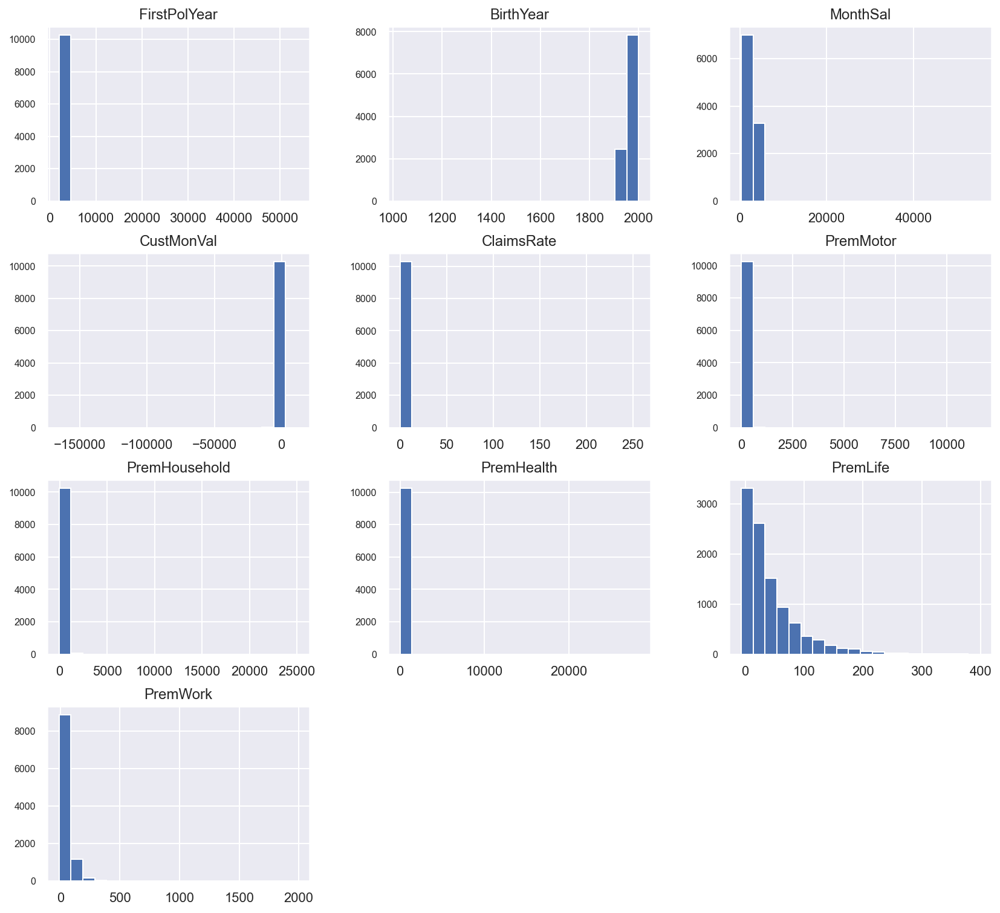

In [13]:
# Numerical Variables Bar Chart
df_num.hist(figsize=(14, 13), bins=20, ylabelsize=8);

#### Catehorigal Variables' frequencies

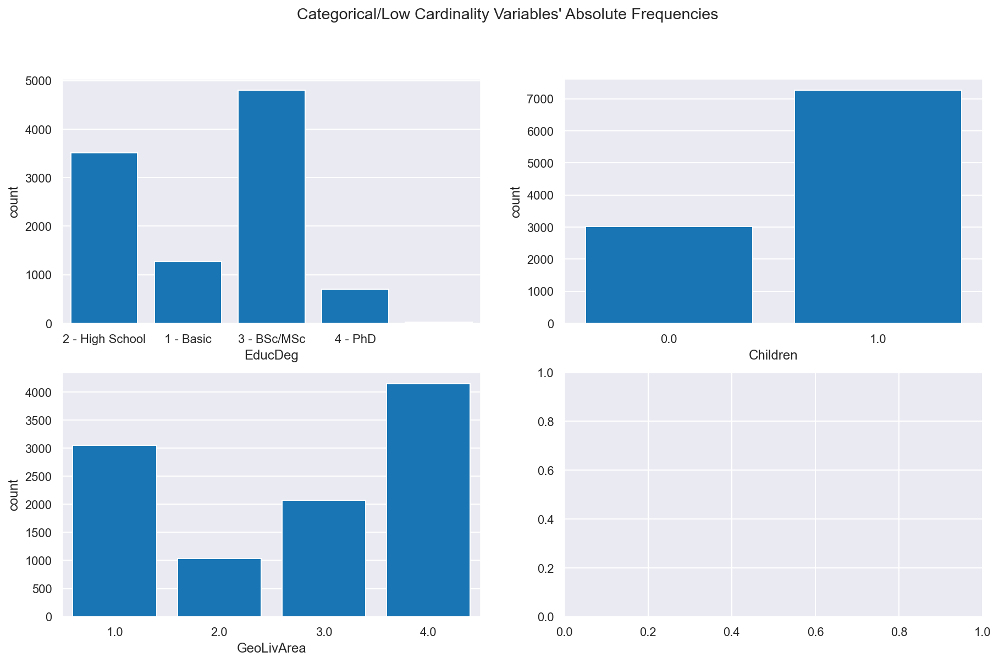

In [14]:
# All Non-Metric Variables' Absolute Frequencies
sns.set()

# Prepare figure. Create individual axes where each bar plot will be placed
fig, axes = plt.subplots(2, ceil(len(non_metric_features) / 2), figsize=(15,9))

# Plot data
# Iterate across axes objects and associate each bar plot (hint: use the ax argument):
for ax, feat in zip(axes.flatten(), non_metric_features): # Notice the zip() function and flatten() method
    sns.countplot(df[feat].astype(object), ax=ax, color='#007acc')

title = "Categorical/Low Cardinality Variables' Absolute Frequencies"
plt.suptitle(title)
plt.show()


#### Pairwise Relationship of Numerical varaibles

    
</a>    



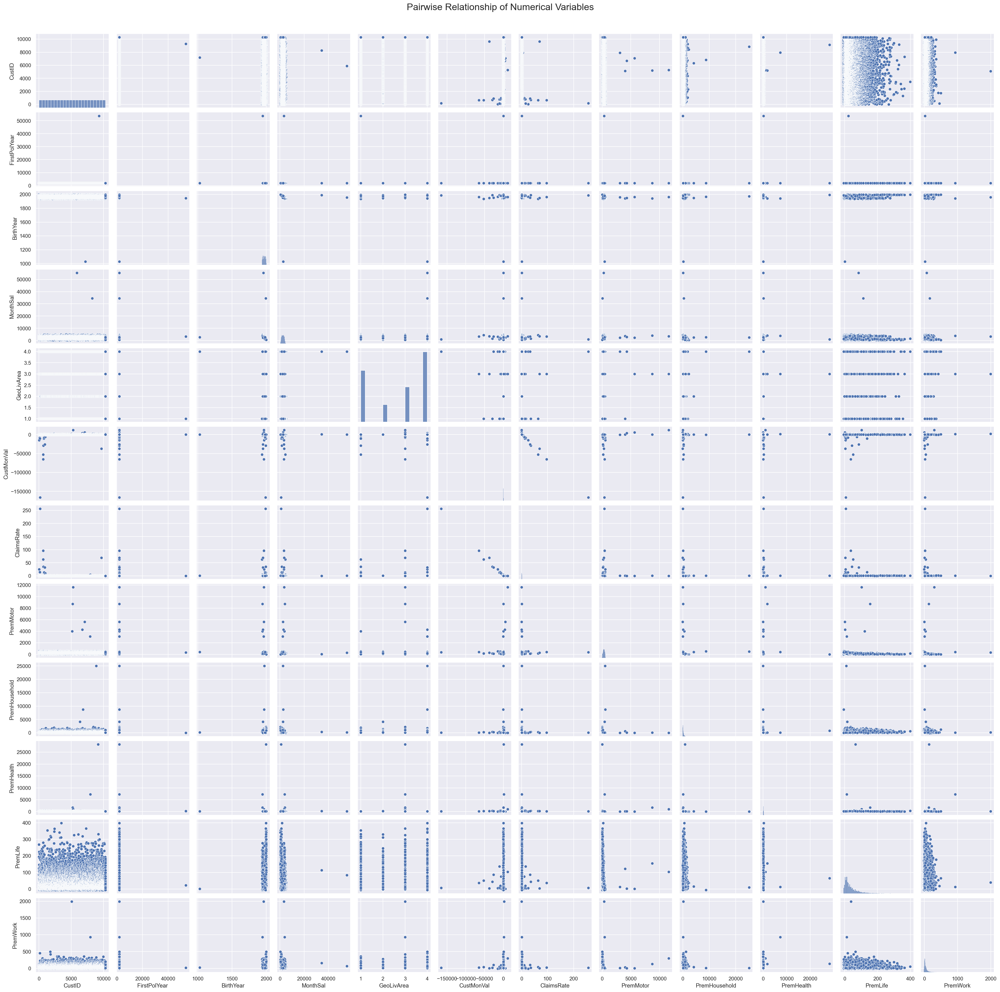

In [12]:
# Pairwise Relationship of Numerical Variables
sns.set()

# Setting pairplot
sns.pairplot(df[metric_features], diag_kind="hist")

# Layout
plt.subplots_adjust(top=0.95)
plt.suptitle("Pairwise Relationship of Numerical Variables", fontsize=20)

plt.show()

<a class="anchor">
 
### Checking for outliers using boxplots

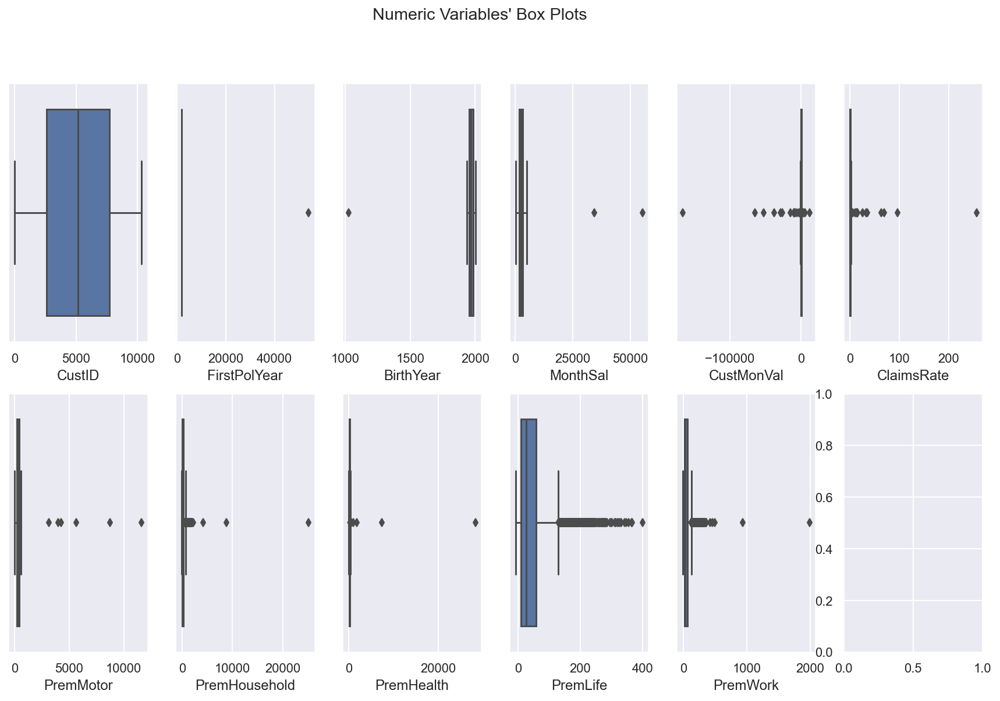

In [15]:
# All Numeric Variables' Box Plots in one figure
sns.set()

# Prepare figure. Create individual axes where each box plot will be placed
fig, axes = plt.subplots(2, ceil(len(metric_features) / 2), figsize=(15, 9))

# Plot data
# Iterate across axes objects and associate each box plot (hint: use the ax argument):
for ax, feat in zip(axes.flatten(), metric_features): # Notice the zip() function and flatten() method
    sns.boxplot(x=df[feat], ax=ax)
    
# Layout
# Add a centered title to the figure:
title = "Numeric Variables' Box Plots"

plt.suptitle(title)

plt.show()

<u>Note:<u> The visualization shown here are so bad because the data is not preprocessed yet ( missing values, outliers ... )

<a class="anchor">
 
### Checking variables' correlations

In [16]:
df.corr().round(2)

,CustID,FirstPolYear,BirthYear,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,1.00,0.01,0.01,-0.01,-0.01,-0.00,0.03,-0.03,-0.01,0.02,0.01,0.01,0.02
FirstPolYear,0.01,1.00,-0.01,0.01,-0.01,-0.02,0.00,-0.00,0.00,-0.01,0.00,-0.00,-0.00
BirthYear,0.01,-0.01,1.00,-0.70,-0.02,0.44,0.00,0.00,-0.16,0.15,0.00,0.23,0.21
MonthSal,-0.01,0.01,-0.70,1.00,0.02,-0.39,-0.00,-0.00,0.14,-0.13,-0.00,-0.20,-0.17
GeoLivArea,-0.01,-0.01,-0.02,0.02,1.00,-0.02,-0.01,0.01,0.00,0.01,0.00,0.01,0.00
Children,-0.00,-0.02,0.44,-0.39,-0.02,1.00,-0.00,-0.00,0.16,-0.06,-0.07,-0.12,-0.09
CustMonVal,0.03,0.00,0.00,-0.00,-0.01,-0.00,1.00,-0.99,0.03,0.03,0.00,0.01,0.02
ClaimsRate,-0.03,-0.00,0.00,-0.00,0.01,-0.00,-0.99,1.00,-0.01,-0.01,0.01,0.00,-0.00
PremMotor,-0.01,0.00,-0.16,0.14,0.00,0.16,0.03,-0.01,1.00,-0.28,-0.08,-0.41,-0.35
PremHousehold,0.02,-0.01,0.15,-0.13,0.01,-0.06,0.03,-0.01,-0.28,1.00,0.02,0.26,0.24


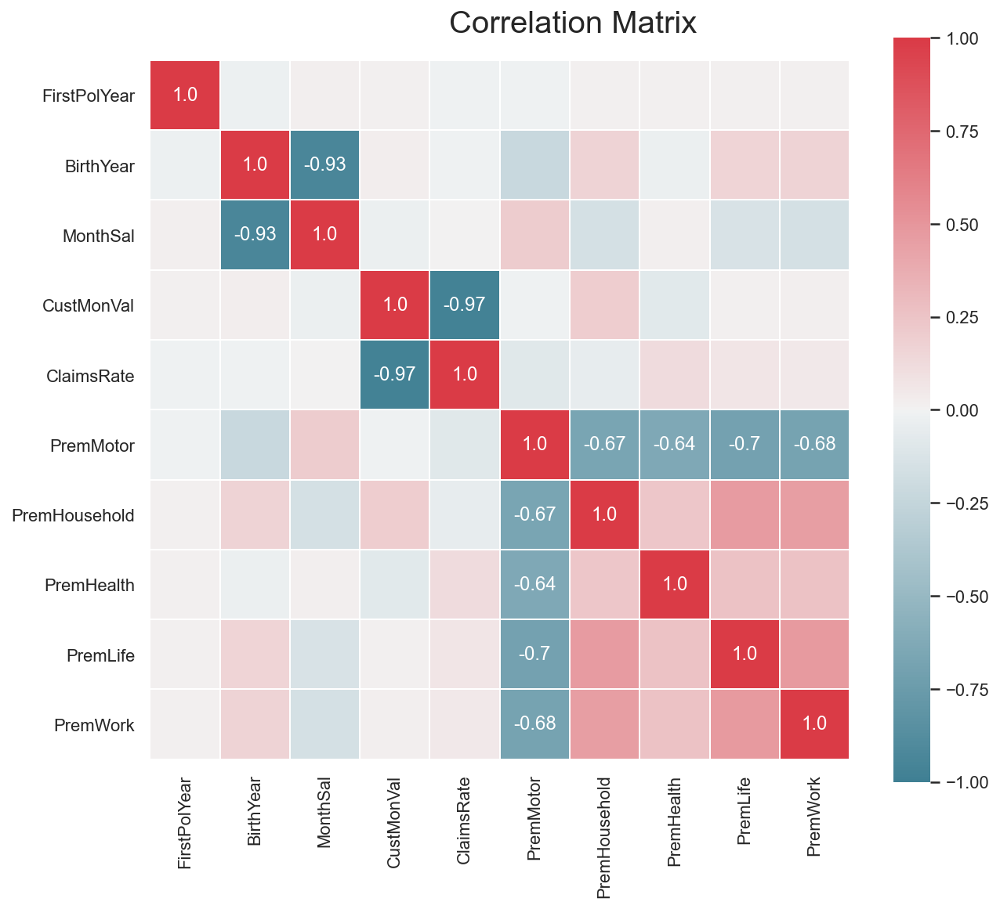

In [17]:
# Prepare figure
fig = plt.figure(figsize=(10, 8))

# Obtain correlation matrix. Round the values to 2 decimal cases. Use the DataFrame corr() and round() method.
df_num = df.drop(columns=['CustID', 'GeoLivArea', 'EducDeg', 'Children']) #we exclude categorical variables
corr = df_num.corr(method='spearman').round(2)

# Build annotation matrix (values above |0.5| will appear annotated in the plot)
mask_annot = np.absolute(corr.values) >= 0.5
annot = np.where(mask_annot, corr.values, np.full(corr.shape,"")) # Try to understand what this np.where() does

# Plot heatmap of the correlation matrix
sns.heatmap(data=corr, annot=annot, cmap=sns.diverging_palette(220, 10, as_cmap=True), 
            fmt='s', vmin=-1, vmax=1, center=0, square=True, linewidths=.5)

# Layout
fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix", fontsize=20)

# plt.savefig(os.path.join('..', 'figures', 'correlation_matrix.png'), dpi=200)

plt.show()

<a class="anchor" id="forth-bullet">     

# 4. Data cleansing and Preprocessing
    
</a>
</div>


<a class="anchor">     

### Cohrence check

In [18]:
#first we create a copy of the original df
df_c = df.copy()

#### Coherence Check 1

The Data is collected in 2016 so we must drop all FirstPolYear that is bigger than 2016

In [19]:
df_c[df_c['FirstPolYear'] >2016.0]

,CustID,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
9294,9295.0,53784.0,1948.0,3 - BSc/MSc,3268.0,1.0,0.0,348.85,0.37,351.4,15.0,187.37,22.45,17.78


With the same logic, we must drop all BirthYear that are bigger than 2016 or smaller than 1900 (that would mean someone older than 122 years which is very unlikely)

In [20]:
df_c[df_c['BirthYear'] < 1900]

,CustID,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
7195,7196.0,1993.0,1028.0,3 - BSc/MSc,2830.0,4.0,0.0,146.02,0.77,428.97,192.8,108.91,1.89,23.67


In [21]:
df_c[df_c['BirthYear'] > 2016]

,CustID,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork


In [22]:
# Drop all rows for which the FirstPolYear is greater than the current year (2016), 
#or for which the BirthYear is >2016 or < 1900

df_c.drop(df_c[df_c['FirstPolYear'] > 2016].index, inplace = True)
df_c.drop(df_c[df_c['BirthYear'] < 1900].index, inplace = True)
df_c.drop(df_c[df_c['BirthYear'] > 2016].index, inplace = True)

In [23]:
print(df_c.shape) # 2 rows were dropped

(10294, 14)


#### Coherence check 2
There are almost 200 rows in our dataset which indicates that the firstPolYear is less than the birthYear which does not make anysense, since a client cannot be one of our customer before even being born.<br>
It represents 2000 rows of the data, whic is almost 20 % of our data, so we can't remove this much of data.<br>

In [24]:
df_c['cc_Pyear_Byear']= df_c['FirstPolYear']-df_c['BirthYear']

In [25]:
df_c[df_c['cc_Pyear_Byear']<0].shape

(1997, 15)

Our team agreed to make the following assumption:
When the FirstPolyear is smaller that the birthYear, we are going to assume that BirthYear and FirstPolYear has been switched by mistake when the data was collected and they need to be switched back.

In [26]:
for i in df_c.index :
#     print (df['FirstPolYear'][i], df['BirthYear'][i])
    aux = 0
    if (df_c['FirstPolYear'][i] < df_c['BirthYear'][i]):
        aux = df_c['BirthYear'][i]
        df_c['BirthYear'][i] = df_c['FirstPolYear'][i]
        df_c['FirstPolYear'][i] = aux

In [27]:
df_c[df_c['BirthYear']>df_c['FirstPolYear']]

,CustID,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,cc_Pyear_Byear


In [28]:
df_c['cc_Pyear_Byear']= df_c['FirstPolYear']-df_c['BirthYear']

In [29]:
df_c[df_c['cc_Pyear_Byear']<0].shape

(0, 15)

In [30]:
df_c[df_c['BirthYear']>df_c['FirstPolYear']].count()

CustID            0
FirstPolYear      0
BirthYear         0
EducDeg           0
MonthSal          0
GeoLivArea        0
Children          0
CustMonVal        0
ClaimsRate        0
PremMotor         0
PremHousehold     0
PremHealth        0
PremLife          0
PremWork          0
cc_Pyear_Byear    0
dtype: int64

In [31]:
df_c =  df_c.drop(columns=['cc_Pyear_Byear'])

In [32]:
df_c.head()
df_c.shape

(10294, 14)

#### Coherence Check 3

We checked that no client was earning a salary, while having less than 16 years old, since it's the legal age to work in Portugal.

In [33]:
df_c.loc[(2016 - df_c['BirthYear'] < 16) & (df_c['MonthSal']>0)]

,CustID,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork


With the the same logic than above applied, a client cannot be less than 16 and have a BSc/MSc or a PhD.

In [34]:
df_c['EducDeg'].unique()

array(['2 - High School', '1 - Basic', '3 - BSc/MSc', '4 - PhD', ''],
      dtype=object)

In [35]:
df_c.loc[(df_c['EducDeg'] == '3 - BSc/MSc') & (2016 - df_c['BirthYear'] < 16)]

,CustID,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork


In [36]:
df_c.loc[(df_c['EducDeg'] == '4 - PhD') & (2016 - df_c['BirthYear'] < 16)]

,CustID,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork


<a class="anchor" id="1.2">
 
### Dealing with Missing Values

In [37]:
# First, we replace the strange characters by NaN
strange_values_list = ["!","$","%","?","*","+","_","@","€"," ","{", ""]
df_c.replace(strange_values_list,np.nan, inplace=True)

In [38]:
# count of missing values
df_c.isna().sum()

CustID             0
FirstPolYear      30
BirthYear         17
EducDeg           17
MonthSal          36
GeoLivArea         1
Children          21
CustMonVal         0
ClaimsRate         0
PremMotor         34
PremHousehold      0
PremHealth        43
PremLife         104
PremWork          86
dtype: int64

In [39]:
#First, we checked if the Premium with NaN has '0' as a values, that will indicate he doesn't pay an insurance for this one
print(df_c[df_c['PremWork'] == 0].shape)
print(df_c[df_c['PremLife'] == 0].shape)
print(df_c[df_c['PremHealth'] == 0].shape)
print(df_c[df_c['PremMotor'] == 0].shape)

(0, 14)
(0, 14)
(0, 14)
(0, 14)


In [40]:
# They all don't have any, which not make sense, so we decided to replace the NaN with a 0 for the Premiums
df_c['PremWork'] = df_c['PremWork'].fillna(0)
df_c['PremLife'] = df_c['PremLife'].fillna(0)
df_c['PremHealth'] = df_c['PremHealth'].fillna(0)
df_c['PremMotor'] = df_c['PremMotor'].fillna(0)

For the other metric features we're going to replace the missing values using KNN imputer

In [41]:
imputer = KNNImputer(n_neighbors=5, weights="uniform")
df_c[metric_features] = imputer.fit_transform(df_c[metric_features])

In [42]:
modes = df_c[non_metric_features].mode().loc[0]
modes

EducDeg       3 - BSc/MSc
Children              1.0
GeoLivArea            4.0
Name: 0, dtype: object

In [43]:
# df.fillna(df.median(), inplace=True)
df_c.fillna(modes, inplace=True)
df_c.isna().sum()  # checking how many NaNs we still have

CustID           0
FirstPolYear     0
BirthYear        0
EducDeg          0
MonthSal         0
GeoLivArea       0
Children         0
CustMonVal       0
ClaimsRate       0
PremMotor        0
PremHousehold    0
PremHealth       0
PremLife         0
PremWork         0
dtype: int64

In [44]:
df_c.info ()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10294 entries, 0 to 10295
Data columns (total 14 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   CustID         10294 non-null  float64
 1   FirstPolYear   10294 non-null  float64
 2   BirthYear      10294 non-null  float64
 3   EducDeg        10294 non-null  object 
 4   MonthSal       10294 non-null  float64
 5   GeoLivArea     10294 non-null  float64
 6   Children       10294 non-null  float64
 7   CustMonVal     10294 non-null  float64
 8   ClaimsRate     10294 non-null  float64
 9   PremMotor      10294 non-null  float64
 10  PremHousehold  10294 non-null  float64
 11  PremHealth     10294 non-null  float64
 12  PremLife       10294 non-null  float64
 13  PremWork       10294 non-null  float64
dtypes: float64(13), object(1)
memory usage: 1.4+ MB


<a class="anchor" id="1.2">
 
### Fix wrong Types

In [45]:
df_c.dtypes

CustID           float64
FirstPolYear     float64
BirthYear        float64
EducDeg           object
MonthSal         float64
GeoLivArea       float64
Children         float64
CustMonVal       float64
ClaimsRate       float64
PremMotor        float64
PremHousehold    float64
PremHealth       float64
PremLife         float64
PremWork         float64
dtype: object

In [46]:
df_c["FirstPolYear"] = df_c["FirstPolYear"].astype(int)
df_c["BirthYear"] = df_c["BirthYear"].astype(int)
df_c["GeoLivArea"] = df_c["GeoLivArea"].astype(int)
df_c["Children"] = df_c["Children"].astype(bool)

In [47]:
#Let's change EducDeg 'object' types as 'float64'
df_c['EducDeg'] = df_c['EducDeg'].factorize()[0]
df_c.EducDeg = df_c.EducDeg.astype(float)

In [48]:
df_c.dtypes

CustID           float64
FirstPolYear       int32
BirthYear          int32
EducDeg          float64
MonthSal         float64
GeoLivArea         int32
Children            bool
CustMonVal       float64
ClaimsRate       float64
PremMotor        float64
PremHousehold    float64
PremHealth       float64
PremLife         float64
PremWork         float64
dtype: object

<a class="anchor" id="1.2">
 
### Dealing with Outliers and visualization

We tried several methods while dealing with outliers before selecting the Final one

In [49]:
# Define final metric and non-metric features. 
non_metric_features = ["EducDeg", "Children","GeoLivArea"]
metric_features = df_c.columns.drop(non_metric_features)

In [50]:
df_c[metric_features]

,CustID,FirstPolYear,BirthYear,MonthSal,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
0,1.0,1985,1982,2177.0,380.97,0.39,375.85,79.45,146.36,47.01,16.89
1,2.0,1995,1981,677.0,-131.13,1.12,77.46,416.20,116.69,194.48,106.13
2,3.0,1991,1970,2277.0,504.67,0.28,206.15,224.50,124.58,86.35,99.02
3,4.0,1990,1981,1099.0,-16.99,0.99,182.48,43.35,311.17,35.34,28.34
4,5.0,1986,1973,1763.0,35.23,0.90,338.62,47.80,182.59,18.78,41.45
...,...,...,...,...,...,...,...,...,...,...,...
10291,10292.0,1984,1949,3188.0,-0.11,0.96,393.74,49.45,173.81,9.78,14.78
10292,10293.0,1977,1952,2431.0,1405.60,0.00,133.58,1035.75,143.25,12.89,105.13
10293,10294.0,1994,1976,2918.0,524.10,0.21,403.63,132.80,142.25,12.67,4.89
10294,10295.0,1981,1977,1971.0,250.05,0.65,188.59,211.15,198.37,63.90,112.91


In [51]:
df_c[non_metric_features]

,EducDeg,Children,GeoLivArea
0,0.0,True,1
1,0.0,True,4
2,1.0,False,3
3,2.0,True,4
4,2.0,True,4
...,...,...,...
10291,3.0,False,2
10292,1.0,False,3
10293,2.0,True,1
10294,1.0,True,2


#### 1) IQR

In [52]:
# q25 = df_c.quantile(.25)
# q75 = df_c.quantile(.75)
# iqr = (q75 - q25)

# upper_lim = q75 + 1.5 * iqr
# lower_lim = q25 - 1.5 * iqr

# filters2 = []
# for metric in metric_features:
#     llim = lower_lim[metric]
#     ulim = upper_lim[metric]
#     filters2.append(df[metric].between(llim, ulim, inclusive=True))

# filters2 = pd.Series(np.all(filters2, 0))
# df_2 = df[filters2]
# print('Percentage of data kept after removing outliers:', np.round(df_2.shape[0] / df_c.shape[0], 4))
# # df.quantile(.25)

#### 2) Zscore

In [53]:
# Z_score outlier removel 
from scipy.stats import zscore
# from scipy  import stats
from scipy import stats

z_scores = stats.zscore(df_c[metric_features])
# calculate z-scores of `df`

abs_z_scores = np.abs(z_scores)
filtered_entries = (abs_z_scores < 4).all(axis=1)
new_df = df_c[filtered_entries]


In [54]:
print('Percentage of data kept after removing outliers:', np.round(new_df.shape[0] / df_c.shape[0], 4))

Percentage of data kept after removing outliers: 0.9833


#### 3) Manual method => Final Method

#### FirstPolyear 

[Text(0.5, 0, '')]

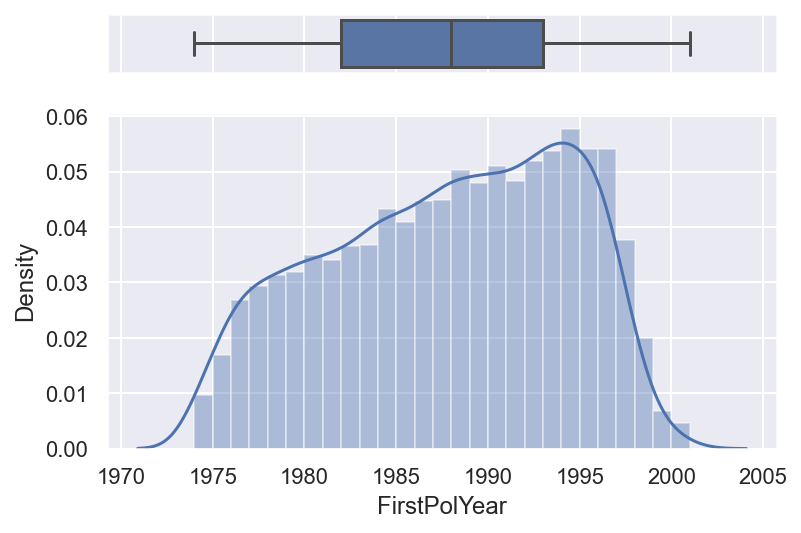

In [55]:
# Cut the window in 2 parts
f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)})
 
# Add a graph in each part
sns.boxplot(df_c["FirstPolYear"], ax=ax_box)
sns.distplot(df_c["FirstPolYear"], ax=ax_hist)
 
# Remove x axis name for the boxplot
ax_box.set(xlabel='')

In [56]:
# first let's make a copy of the df so we can caculate the percentage of data droped later.
df_central = df_c.copy()
df_central1 = df_c.copy()
df_central2 = df_c.copy()

In [57]:
# we have no outliers, the one observed in the boxplots of part 2. has been removed in coherence check 
#DROP ABOVE  10000
data_to_drop = df_central[(df_central["FirstPolYear"]>10000)]

data_to_drop_percent = ((len(data_to_drop.index))/(len(df_central.index)))*100
data_to_drop_percent = "{:.2f}".format(data_to_drop_percent)

print(f"\n Number of records dropped = \t {len(data_to_drop.index)} \n")
print(f"\n Percentage of records dropped = \t{data_to_drop_percent}% \n")

df_central.drop(data_to_drop.index, inplace=True)


 Number of records dropped = 	 0 


 Percentage of records dropped = 	0.00% 



#### Birthyear

[Text(0.5, 0, '')]

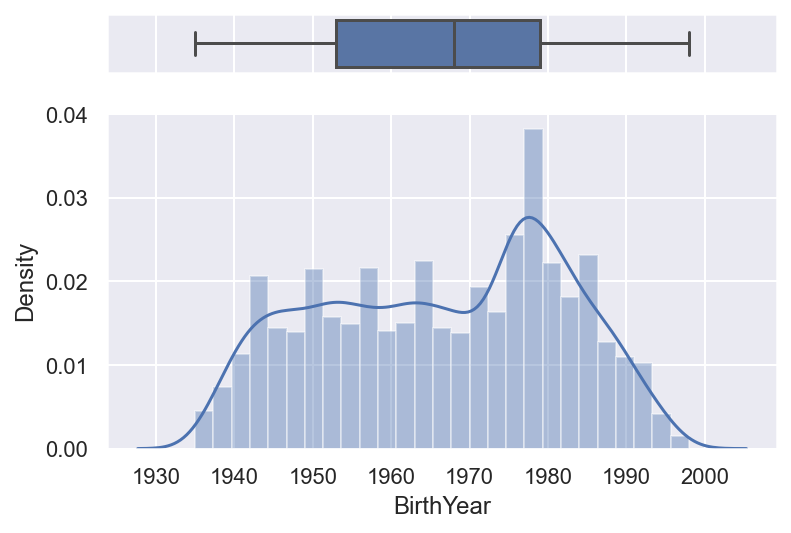

In [58]:
# Cut the window in 2 parts
f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)})
 
# Add a graph in each part
sns.boxplot(df_central["BirthYear"], ax=ax_box)
sns.distplot(df_central["BirthYear"], ax=ax_hist)
 
# Remove x axis name for the boxplot
ax_box.set(xlabel='')

In [59]:
# we have no outliers, the one observed in the boxplots of part 2. has been removed in coherence check 
#DROP less than  1500
data_to_drop = df_central[(df_central["BirthYear"]<1500)]

data_to_drop_percent = ((len(data_to_drop.index))/(len(df_central.index)))*100
data_to_drop_percent = "{:.2f}".format(data_to_drop_percent)

print(f"\n Number of records dropped = \t {len(data_to_drop.index)} \n")
print(f"\n Percentage of records dropped = \t{data_to_drop_percent}% \n")

df_central.drop(data_to_drop.index, inplace=True)


 Number of records dropped = 	 0 


 Percentage of records dropped = 	0.00% 



#### Salary

[Text(0.5, 0, '')]

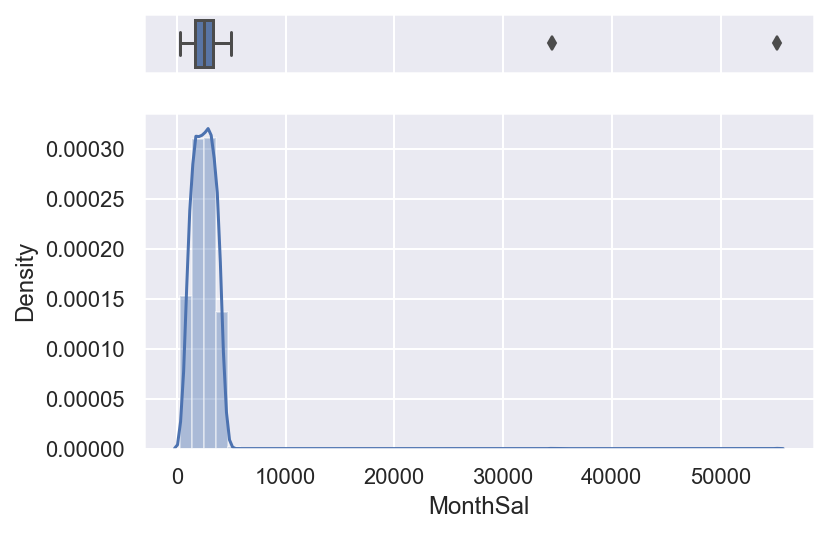

In [60]:
# Cut the window in 2 parts
f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)})
 
# Add a graph in each part
sns.boxplot(df_central["MonthSal"], ax=ax_box)
sns.distplot(df_central["MonthSal"], ax=ax_hist)
 
# Remove x axis name for the boxplot
ax_box.set(xlabel='')

In [61]:
# we have 2 outliers 
#DROP ABOVE  30000
data_to_drop = df_central[(df_central["MonthSal"]>30000)]

data_to_drop_percent = ((len(data_to_drop.index))/(len(df_central.index)))*100
data_to_drop_percent = "{:.2f}".format(data_to_drop_percent)

print(f"\n Number of records dropped = \t {len(data_to_drop.index)} \n")
print(f"\n Percentage of records dropped = \t{data_to_drop_percent}% \n")

df_central.drop(data_to_drop.index, inplace=True)


 Number of records dropped = 	 2 


 Percentage of records dropped = 	0.02% 



#### CMV 

[Text(0.5, 0, '')]

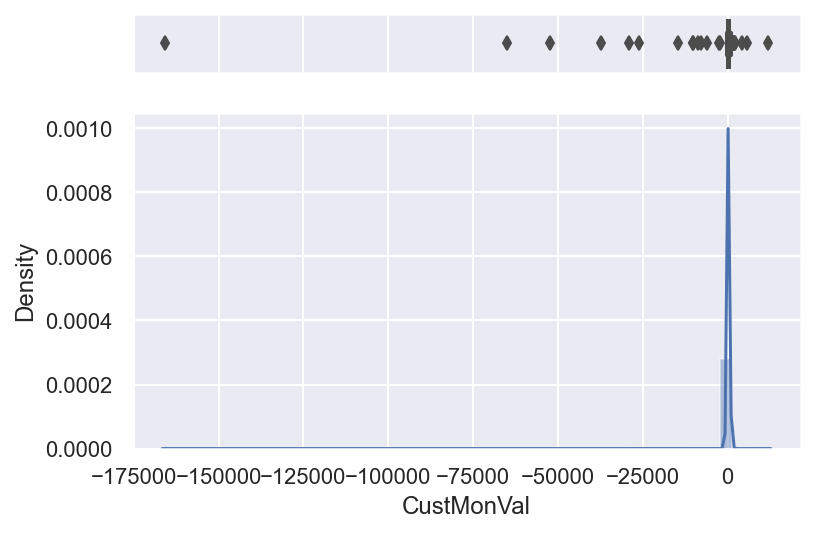

In [62]:
# Cut the window in 2 parts
f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)})
 
# Add a graph in each part
sns.boxplot(df_central["CustMonVal"], ax=ax_box)
sns.distplot(df_central["CustMonVal"], ax=ax_hist)
 
# Remove x axis name for the boxplot
ax_box.set(xlabel='')

In [63]:
# we have 2 outliers 
#DROP ABOVE  10000
filters =((df_central["CustMonVal"]>1250) | (df_central["CustMonVal"]<-10000)  )
data_to_drop = df_central[filters]
# data_to_drop.append (df_central[ (df_central["CMV"]< -2000)])
data_to_drop_percent = ((len(data_to_drop.index))/(len(df_central.index)))*100
data_to_drop_percent = "{:.2f}".format(data_to_drop_percent)

print(f"\n Number of records dropped = \t {len(data_to_drop.index)} \n")
print(f"\n Percentage of records dropped = \t{data_to_drop_percent}% \n")

df_central.drop(data_to_drop.index, inplace=True)


 Number of records dropped = 	 39 


 Percentage of records dropped = 	0.38% 



#### claims rate

[Text(0.5, 0, '')]

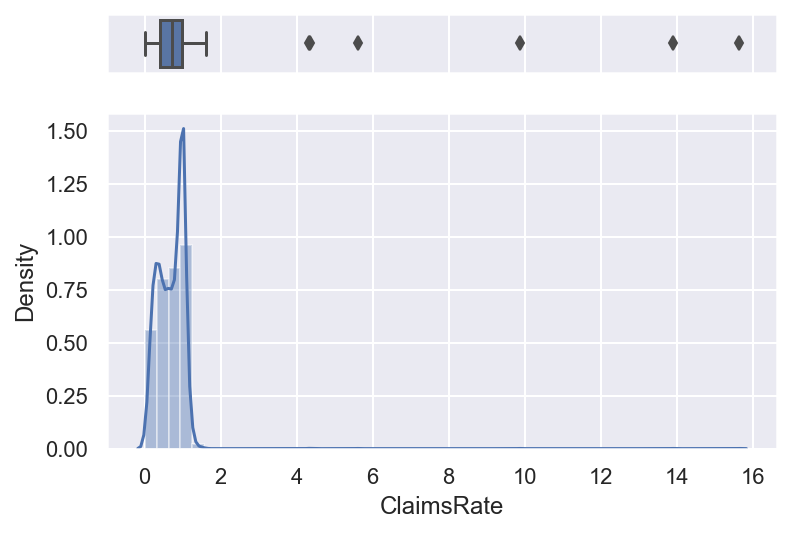

In [64]:
# Cut the window in 2 parts
f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)})
 
# Add a graph in each part
sns.boxplot(df_central["ClaimsRate"], ax=ax_box)
sns.distplot(df_central["ClaimsRate"], ax=ax_hist)
 
# Remove x axis name for the boxplot
ax_box.set(xlabel='')

In [65]:
#DROP ABOVE  4
filters =((df_central["ClaimsRate"]>4))
data_to_drop = df_central[filters]
# data_to_drop.append (df_central[ (df_central["CMV"]< -2000)])
data_to_drop_percent = ((len(data_to_drop.index))/(len(df_central.index)))*100
data_to_drop_percent = "{:.2f}".format(data_to_drop_percent)

print(f"\n Number of records dropped = \t {len(data_to_drop.index)} \n")
print(f"\n Percentage of records dropped = \t{data_to_drop_percent}% \n")

df_central.drop(data_to_drop.index, inplace=True)


 Number of records dropped = 	 6 


 Percentage of records dropped = 	0.06% 



#### PremMotor

[Text(0.5, 0, '')]

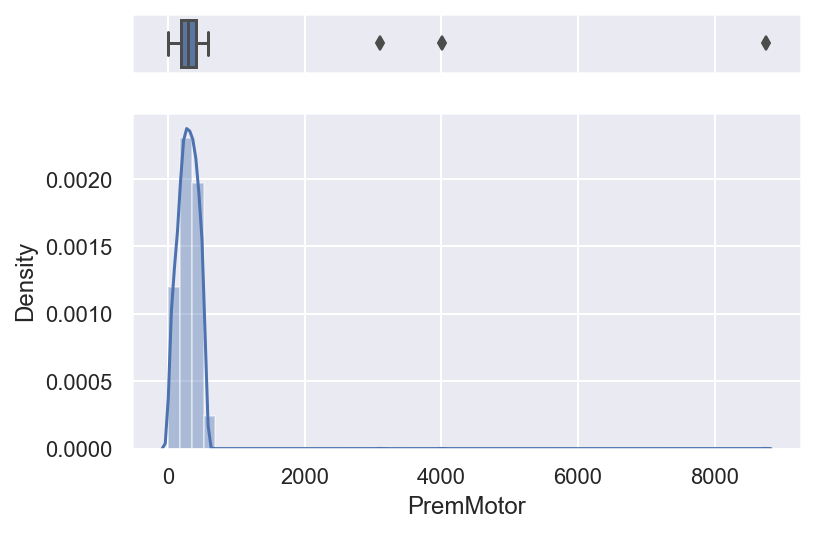

In [66]:
# Cut the window in 2 parts
f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)})
 
# Add a graph in each part
sns.boxplot(df_central["PremMotor"], ax=ax_box)
sns.distplot(df_central["PremMotor"], ax=ax_hist)
 
# Remove x axis name for the boxplot
ax_box.set(xlabel='')

In [67]:
#DROP ABOVE  2000
filters =((df_central["PremMotor"]>2000))
data_to_drop = df_central[filters]
# data_to_drop.append (df_central[ (df_central["CMV"]< -2000)])
data_to_drop_percent = ((len(data_to_drop.index))/(len(df_central.index)))*100
data_to_drop_percent = "{:.2f}".format(data_to_drop_percent)

print(f"\n Number of records dropped = \t {len(data_to_drop.index)} \n")
print(f"\n Percentage of records dropped = \t{data_to_drop_percent}% \n")

df_central.drop(data_to_drop.index, inplace=True)


 Number of records dropped = 	 3 


 Percentage of records dropped = 	0.03% 



#### PremHousehold	

[Text(0.5, 0, '')]

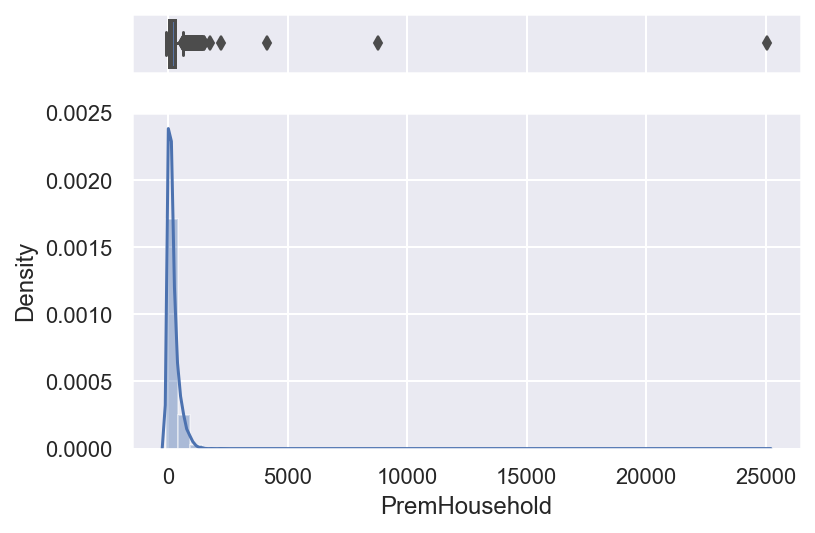

In [68]:
# Cut the window in 2 parts
f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)})
 
# Add a graph in each part
sns.boxplot(df_central["PremHousehold"], ax=ax_box)
sns.distplot(df_central["PremHousehold"], ax=ax_hist)
 
# Remove x axis name for the boxplot
ax_box.set(xlabel='')

In [69]:
#DROP ABOVE  4000
filters =((df_central["PremHousehold"]>1250))
data_to_drop = df_central[filters]
# data_to_drop.append (df_central[ (df_central["CMV"]< -2000)])
data_to_drop_percent = ((len(data_to_drop.index))/(len(df_central.index)))*100
data_to_drop_percent = "{:.2f}".format(data_to_drop_percent)

print(f"\n Number of records dropped = \t {len(data_to_drop.index)} \n")
print(f"\n Percentage of records dropped = \t{data_to_drop_percent}% \n")

df_central.drop(data_to_drop.index, inplace=True)


 Number of records dropped = 	 23 


 Percentage of records dropped = 	0.22% 



#### PremHealth	

[Text(0.5, 0, '')]

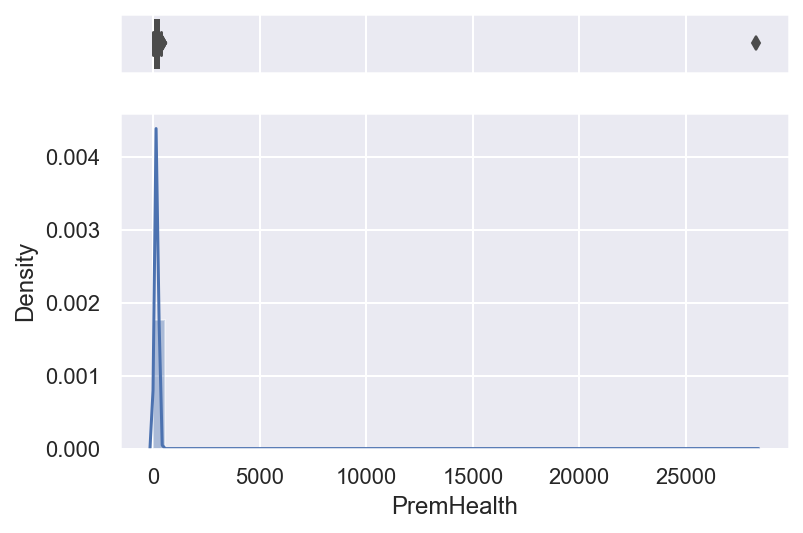

In [70]:
# Cut the window in 2 parts
f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)})
 
# Add a graph in each part
sns.boxplot(df_central["PremHealth"], ax=ax_box)
sns.distplot(df_central["PremHealth"], ax=ax_hist)
 
# Remove x axis name for the boxplot
ax_box.set(xlabel='')

In [71]:
#DROP ABOVE  5000
filters =((df_central["PremHealth"]>420))
data_to_drop = df_central[filters]
# data_to_drop.append (df_central[ (df_central["CMV"]< -2000)])
data_to_drop_percent = ((len(data_to_drop.index))/(len(df_central.index)))*100
data_to_drop_percent = "{:.2f}".format(data_to_drop_percent)

print(f"\n Number of records dropped = \t {len(data_to_drop.index)} \n")
print(f"\n Percentage of records dropped = \t{data_to_drop_percent}% \n")

df_central.drop(data_to_drop.index, inplace=True)


 Number of records dropped = 	 4 


 Percentage of records dropped = 	0.04% 



#### PremLife

[Text(0.5, 0, '')]

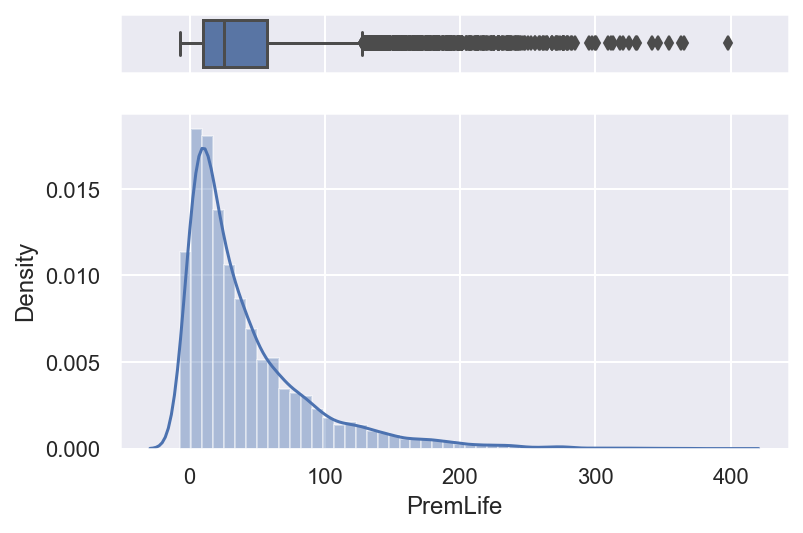

In [72]:
# Cut the window in 2 parts
f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)})
 
# Add a graph in each part
sns.boxplot(df_central["PremLife"], ax=ax_box)
sns.distplot(df_central["PremLife"], ax=ax_hist)
 
# Remove x axis name for the boxplot
ax_box.set(xlabel='')

In [73]:
#DROP ABOVE  300
filters =((df_central["PremLife"]>250))
data_to_drop = df_central[filters]
# data_to_drop.append (df_central[ (df_central["CMV"]< -2000)])
data_to_drop_percent = ((len(data_to_drop.index))/(len(df_central.index)))*100
data_to_drop_percent = "{:.2f}".format(data_to_drop_percent)

print(f"\n Number of records dropped = \t {len(data_to_drop.index)} \n")
print(f"\n Percentage of records dropped = \t{data_to_drop_percent}% \n")

df_central.drop(data_to_drop.index, inplace=True)


 Number of records dropped = 	 50 


 Percentage of records dropped = 	0.49% 



 #### PremWork

[Text(0.5, 0, '')]

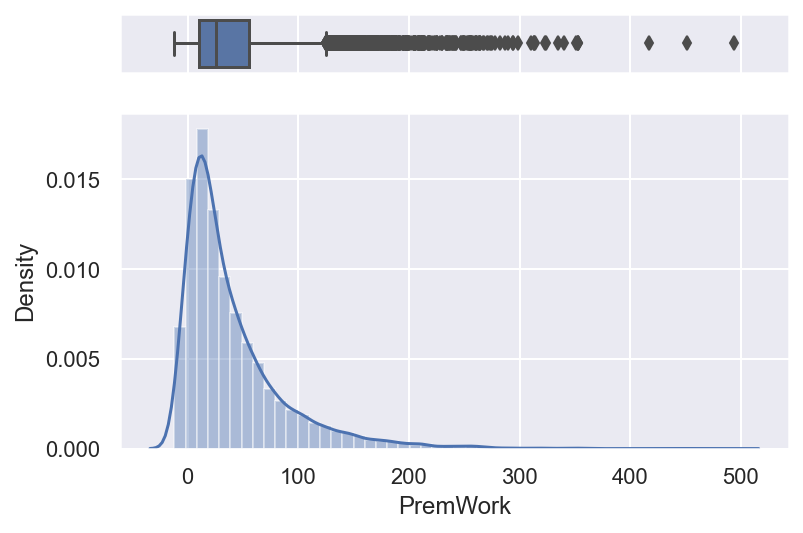

In [74]:
# Cut the window in 2 parts
f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)})
 
# Add a graph in each part
sns.boxplot(df_central["PremWork"], ax=ax_box)
sns.distplot(df_central["PremWork"], ax=ax_hist)
 
# Remove x axis name for the boxplot
ax_box.set(xlabel='')

In [75]:
#DROP ABOVE  350
filters =((df_central["PremWork"]>250))
data_to_drop = df_central[filters]
# data_to_drop.append (df_central[ (df_central["CMV"]< -2000)])
data_to_drop_percent = ((len(data_to_drop.index))/(len(df_central.index)))*100
data_to_drop_percent = "{:.2f}".format(data_to_drop_percent)

print(f"\n Number of records dropped = \t {len(data_to_drop.index)} \n")
print(f"\n Percentage of records dropped = \t{data_to_drop_percent}% \n")

df_central.drop(data_to_drop.index, inplace=True)


 Number of records dropped = 	 52 


 Percentage of records dropped = 	0.51% 



In [76]:
print('Percentage of data kept after removing outliers:', np.round(df_central.shape[0] / df_c.shape[0], 4))

Percentage of data kept after removing outliers: 0.9826


In [77]:
print('Percentage of data kept after removing outliers:', np.round(df_central.shape[0] / df.shape[0], 4))

Percentage of data kept after removing outliers: 0.9824


 <a class="anchor" id="1.2">
 
### Feature engineering

In [78]:
# First, rename columns for more apropriate titles (decriptive)
df_central.rename(columns ={ 'CustMonVal': 'CMV'}, inplace = True)

In [79]:
# Set the Cust_ID as index
df_central['CustID'] = df_central['CustID'].astype(int)
df_central = df_central.set_index('CustID')

In [80]:
df_central.reset_index()

,CustID,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CMV,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
0,1,1985,1982,0.0,2177.0,1,True,380.97,0.39,375.85,79.45,146.36,47.01,16.89
1,2,1995,1981,0.0,677.0,4,True,-131.13,1.12,77.46,416.20,116.69,194.48,106.13
2,3,1991,1970,1.0,2277.0,3,False,504.67,0.28,206.15,224.50,124.58,86.35,99.02
3,4,1990,1981,2.0,1099.0,4,True,-16.99,0.99,182.48,43.35,311.17,35.34,28.34
4,5,1986,1973,2.0,1763.0,4,True,35.23,0.90,338.62,47.80,182.59,18.78,41.45
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10110,10291,1999,1994,1.0,626.0,3,True,176.26,0.85,6.89,878.50,103.13,113.02,201.26
10111,10292,1984,1949,3.0,3188.0,2,False,-0.11,0.96,393.74,49.45,173.81,9.78,14.78
10112,10294,1994,1976,2.0,2918.0,1,True,524.10,0.21,403.63,132.80,142.25,12.67,4.89
10113,10295,1981,1977,1.0,1971.0,2,True,250.05,0.65,188.59,211.15,198.37,63.90,112.91


#### Creating New variables

In [81]:
# Annual Profit for the insurance company => Total of the Premiums
df_central['Annual_profit'] = df_central['PremMotor'] + df_central['PremHousehold'] + df_central['PremHealth'] + df_central['PremLife'] + df_central['PremWork']

In [82]:
# Age of the customer 
df_central['age']=2016-df_central['BirthYear']
df_central =  df_central.drop(columns=['BirthYear'])

In [83]:
# How many years since the customer joined(we can call it loyalty)
df_central['Customer_lifetime']=2016-df_central['FirstPolYear']
df_central =  df_central.drop(columns=['FirstPolYear'])

In [84]:
# Turn MonthSal into YearSal because Premiums are paid annually 
df_central['Yearly_Salary']=12*df_central['MonthSal']
df_central =  df_central.drop(columns=['MonthSal'])

In [85]:
# CMV represents the value of the customer for the company, let's create a new column to visualize who are our valuable 
# customer "1" and the non valuable "0"

conditions = [
    (df_central['CMV'] <= 0),
    (df_central['CMV'] > 0)
    ]

values = ['0', '1'] # create a list of the values we want to assign for each condition

df_central['ClientValue'] = np.select(conditions, values)

In [86]:
df_central.shape

(10115, 15)

In [87]:
#Creating'Gen'
df_central['gen']='gen'

for i in df_central.index:
    if df_central['age'][i]<=20:
        df_central['gen'][i]='Generation Z'
    elif df_central['age'][i]>20 and df_central['age'][i]<=35 :
        df_central['gen'][i]='Generation Y '
    elif df_central['age'][i]>35 and df_central['age'][i]<=51 :
        df_central['gen'][i]='Generation X '
    elif df_central['age'][i]>51 and df_central['age'][i]<=70 :
        df_central['gen'][i]='Baby Boomer'
    elif df_central['age'][i]>70 and df_central['age'][i]<=91 :
        df_central['gen'][i]='The Silent Generation'    

In [88]:
# Define final metric and non-metric features. 
non_metric_features = ["EducDeg", "Children","GeoLivArea","gen","ClientValue"]
metric_features = df_central.columns.drop(non_metric_features)

#### Visualization

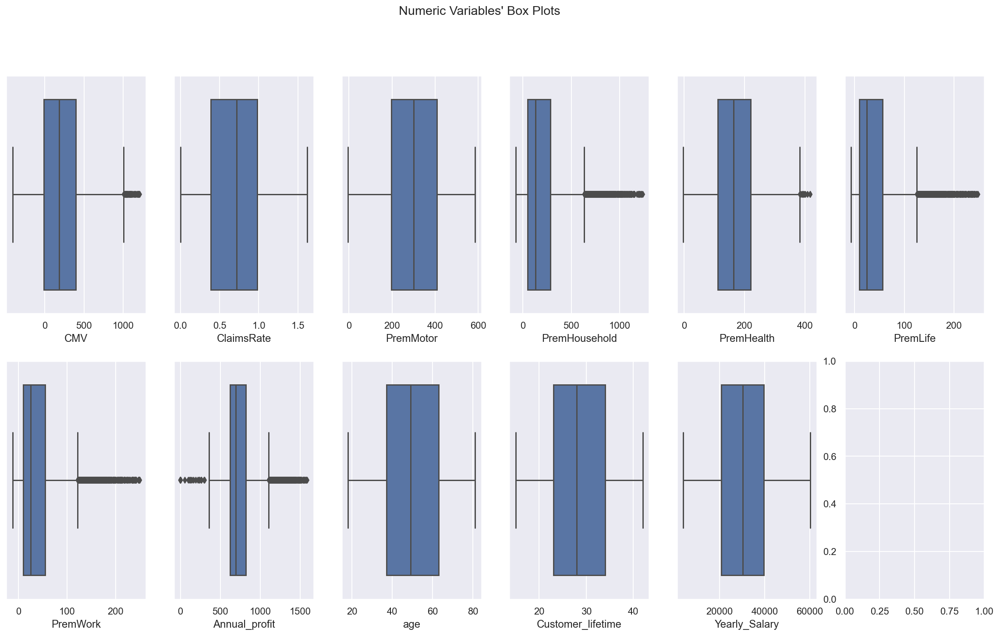

In [89]:
# All Numeric Variables' Box Plots in one figure
sns.set()

# Prepare figure. Create individual axes where each box plot will be placed
fig, axes = plt.subplots(2, ceil(len(metric_features) / 2), figsize=(20, 11))

# Plot data
# Iterate across axes objects and associate each box plot (hint: use the ax argument):
for ax, feat in zip(axes.flatten(), metric_features): # Notice the zip() function and flatten() method
    sns.boxplot(x=df_central[feat], ax=ax)
    
# Layout
# Add a centered title to the figure:
title = "Numeric Variables' Box Plots"

plt.suptitle(title)

plt.show()

[Text(0.5, 0, '')]

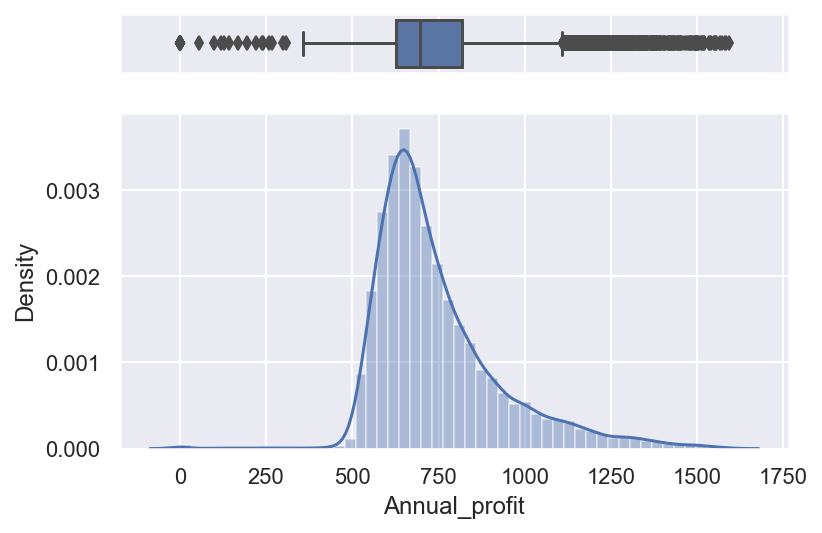

In [90]:
# Cut the window in 2 parts
f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)})
 
# Add a graph in each part
sns.boxplot(df_central["Annual_profit"], ax=ax_box)
sns.distplot(df_central["Annual_profit"], ax=ax_hist)
 
# Remove x axis name for the boxplot
ax_box.set(xlabel='')

In [91]:
#DROP ABOVE  350
filters =((df_central["Annual_profit"]<400))
data_to_drop = df_central[filters]
# data_to_drop.append (df_central[ (df_central["CMV"]< -2000)])
data_to_drop_percent = ((len(data_to_drop.index))/(len(df_central.index)))*100
data_to_drop_percent = "{:.2f}".format(data_to_drop_percent)

print(f"\n Number of records dropped = \t {len(data_to_drop.index)} \n")
print(f"\n Percentage of records dropped = \t{data_to_drop_percent}% \n")

df_central.drop(data_to_drop.index, inplace=True)


 Number of records dropped = 	 30 


 Percentage of records dropped = 	0.30% 



Note: Now after removing the outliers the boxplots are much better.

#### Non-Metric Variables' Absolute Frequencies

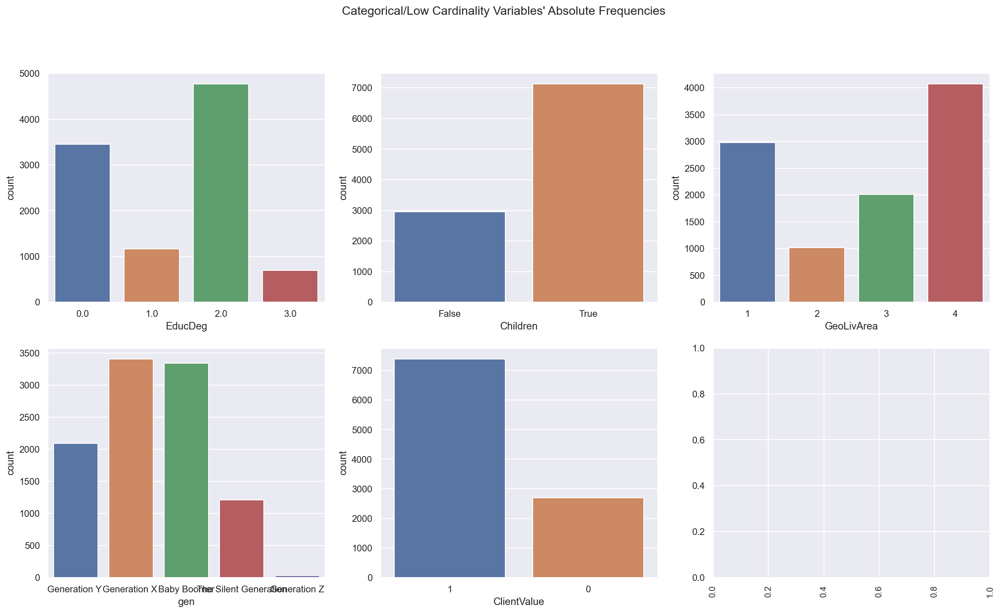

In [92]:
sns.set()

# Prepare figure. Create individual axes where each bar plot will be placed
fig, axes = plt.subplots(2, ceil(len(non_metric_features) / 2), figsize=(20, 11))

# Plot data
# Iterate across axes objects and associate each bar plot (hint: use the ax argument):
for ax, feat in zip(axes.flatten(), non_metric_features): # Notice the zip() function and flatten() method
    sns.countplot(df_central[feat], ax=ax)
    plt.xticks(fontsize= 10, rotation = 90)

title = "Categorical/Low Cardinality Variables' Absolute Frequencies"
plt.suptitle(title)

plt.show()

In [93]:
#We check the missing values in the new variables
df_central.isna().sum()

EducDeg              0
GeoLivArea           0
Children             0
CMV                  0
ClaimsRate           0
PremMotor            0
PremHousehold        0
PremHealth           0
PremLife             0
PremWork             0
Annual_profit        0
age                  0
Customer_lifetime    0
Yearly_Salary        0
ClientValue          0
gen                  0
dtype: int64

<a class="anchor" id="1.2">
 
### Feature Selection

#### Correlation with the new numerical variables

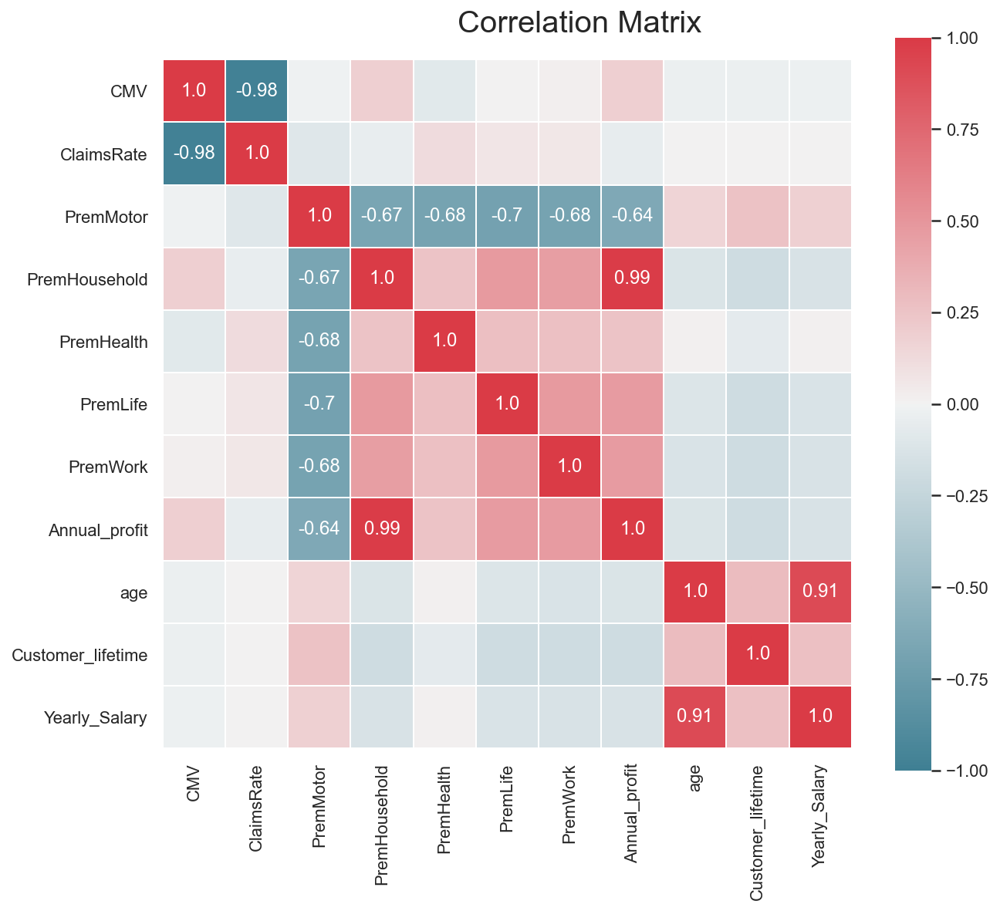

In [94]:
# Prepare figure
fig = plt.figure(figsize=(10, 8))

# Obtain correlation matrix. Round the values to 2 decimal cases. Use the DataFrame corr() and round() method.
corr = np.round(df_central[metric_features].corr(method="spearman"), decimals=2)

# Build annotation matrix (values above |0.5| will appear annotated in the plot)
mask_annot = np.absolute(corr.values) >= 0.5
annot = np.where(mask_annot, corr.values, np.full(corr.shape,"")) # Try to understand what this np.where() does

# Plot heatmap of the correlation matrix
sns.heatmap(data=corr, annot=annot, cmap=sns.diverging_palette(220, 10, as_cmap=True), 
            fmt='s', vmin=-1, vmax=1, center=0, square=True, linewidths=.5)

# Layout
fig.subplots_adjust(top=0.95)
fig.suptitle("Correlation Matrix", fontsize=20)

plt.show()

In [95]:
correlated_features = set()
correlation_matrix = df_central.corr(method = 'spearman')
for i in range(len(correlation_matrix .columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > 0.90:
            colname = correlation_matrix.columns[i]
            correlated_features.add(colname)

In [96]:
correlated_features

{'Annual_profit', 'ClaimsRate', 'Yearly_Salary'}

In [97]:
c = df_central.corr(method="spearman").abs()
s = c.unstack()
so = round(s.sort_values(kind="quicksort"),4)
high_pairs = so[so > 0.90]
high_pairs = high_pairs[high_pairs < 1.0]

In [98]:
pd.set_option('display.max_rows', 562)
high_pairs

Yearly_Salary  age              0.9103
age            Yearly_Salary    0.9103
ClaimsRate     CMV              0.9763
CMV            ClaimsRate       0.9763
Annual_profit  PremHousehold    0.9881
PremHousehold  Annual_profit    0.9881
dtype: float64

<hr> CONCLUSION 1 <hr>
-Looking at the correlation matrix, we can see 'Age' is vey correlated to 'YearSal', so we are deciding to drop it, knowing we already have the new categorical variable 'gen' for generation. <br>
-Same for ClaimsRate over CMV. <br>
-And regarding PremHousehold we're deciding to keep it even though it's correlated because it's an important feature. <br>

In [99]:
df_central =  df_central.drop(columns=['age'])

In [100]:
df_central =  df_central.drop(columns=['ClaimsRate'])

#### Crosstab with categorical variables

Text(0, 0.5, 'Proportion of the client s value')

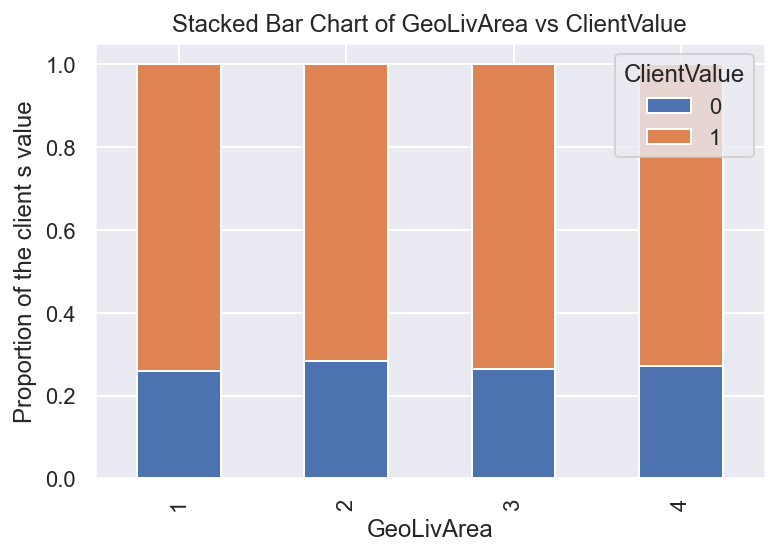

In [101]:
# GeoLivArea
table=pd.crosstab(df_central.GeoLivArea,df_central.ClientValue)
table.div(table.sum(1).astype(float), axis=0).plot(kind='bar', stacked=True)
plt.title('Stacked Bar Chart of GeoLivArea vs ClientValue')
plt.xlabel('GeoLivArea')
plt.ylabel('Proportion of the client s value')

Text(0, 0.5, 'Proportion of the client s value')

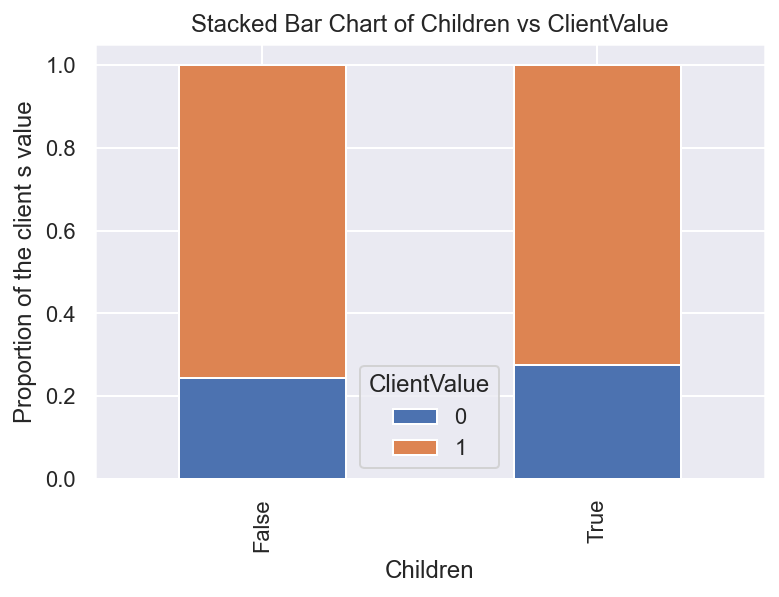

In [102]:
#Children
table=pd.crosstab(df_central.Children,df_central.ClientValue)
table.div(table.sum(1).astype(float), axis=0).plot(kind='bar', stacked=True)
plt.title('Stacked Bar Chart of Children vs ClientValue')
plt.xlabel('Children')
plt.ylabel('Proportion of the client s value')

Text(0, 0.5, 'Proportion of the client s value')

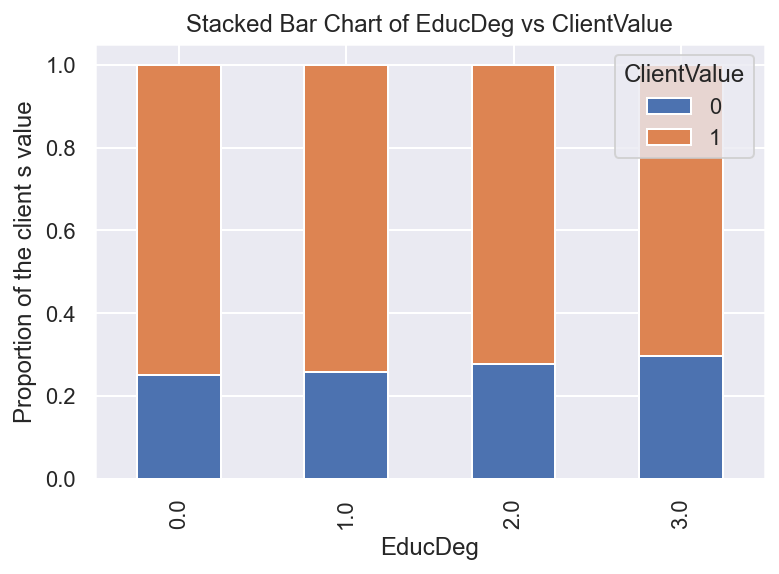

In [103]:
# EducDeg
table=pd.crosstab(df_central.EducDeg,df_central.ClientValue)
table.div(table.sum(1).astype(float), axis=0).plot(kind='bar', stacked=True)
plt.title('Stacked Bar Chart of EducDeg vs ClientValue')
plt.xlabel('EducDeg')
plt.ylabel('Proportion of the client s value')

Text(0, 0.5, 'Proportion of the client s value')

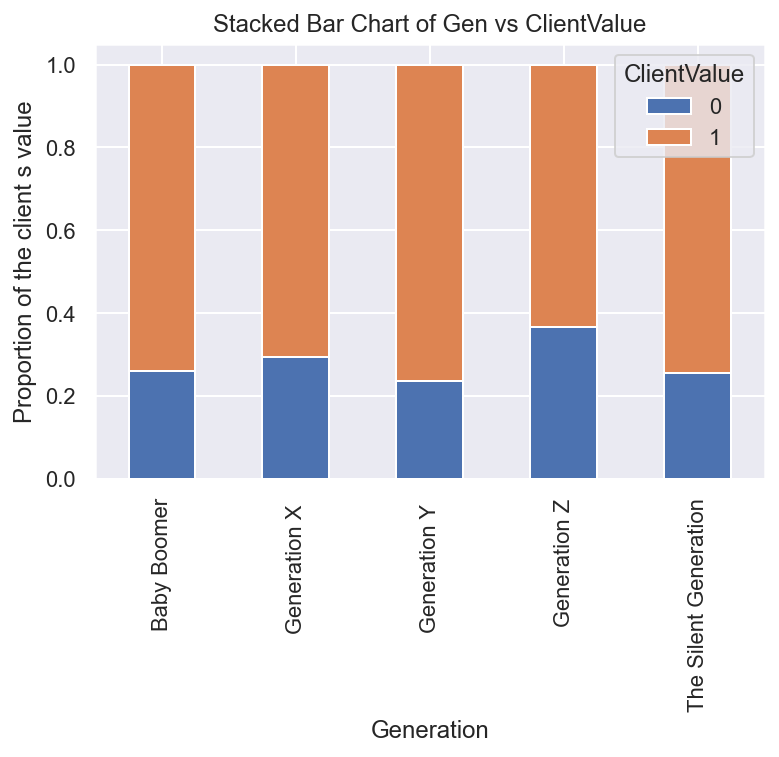

In [104]:
# Generation
table=pd.crosstab(df_central.gen,df_central.ClientValue)
table.div(table.sum(1).astype(float), axis=0).plot(kind='bar', stacked=True)
plt.title('Stacked Bar Chart of Gen vs ClientValue')
plt.xlabel('Generation')
plt.ylabel('Proportion of the client s value')

<hr> CONCLUSION 2 <hr>
-Looking at the crosstab between the 4 categorical variables and the ClientValue, we can see than except for 'Gen', the 3 others don't show a MAJOR impact on the value of the client for the company. However, Children and GeoLicArea seem to be the less relevant ones, with pratically the same result for all values, so we will not keep them. <br>.

In [105]:
df_central = df_central.drop(columns=['GeoLivArea','Children']) 

<a class="anchor" id="1.2">
 
### Data Normalization

In [106]:
#First, defining again metric and non_metric features
non_metric_features = ['EducDeg', 'gen', 'ClientValue']
metric_features = df_central.columns.drop(non_metric_features).to_list()

In [107]:
data_normalized = df_central.copy()

In [108]:
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(data_normalized[metric_features])
data_normalized[metric_features] = scaled_data
data_normalized[metric_features].head()

,CMV,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Annual_profit,Customer_lifetime,Yearly_Salary
CustID,,,,,,,,,
1,0.487277,0.644732,0.117631,0.353997,0.211580,0.110482,0.203340,0.592593,0.393345
2,0.170223,0.138411,0.374105,0.283255,0.789282,0.451757,0.414447,0.222222,0.073379
3,0.563863,0.356778,0.228104,0.302067,0.365691,0.424567,0.267893,0.370370,0.414676
4,0.240890,0.316614,0.090137,0.746954,0.165864,0.154270,0.147526,0.407407,0.163396
5,0.273220,0.581559,0.093526,0.440381,0.100991,0.204406,0.172095,0.555556,0.305034


<a class="anchor" id="1.2">
    
### One hot encoding

In [109]:
df_central.shape

(10085, 12)

In [110]:
df_central['EducDeg'].value_counts()

2.0    4775
0.0    3453
1.0    1164
3.0     693
Name: EducDeg, dtype: int64

In [111]:
#One hot encoding of categorical variables

ohc = OneHotEncoder(sparse=False, drop= 'if_binary')
ohc_feat = ohc.fit_transform(df_central[non_metric_features])
ohc_feat_names = ohc.get_feature_names(non_metric_features)
ohc_df = pd.DataFrame(ohc_feat, index=df_central.index, columns=ohc_feat_names) 
df_ohc = pd.concat([data_normalized.drop(columns=non_metric_features), ohc_df], axis=1)
df_ohc

,CMV,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Annual_profit,Customer_lifetime,Yearly_Salary,EducDeg_0.0,EducDeg_1.0,EducDeg_2.0,EducDeg_3.0,gen_Baby Boomer,gen_Generation X,gen_Generation Y,gen_Generation Z,gen_The Silent Generation,ClientValue_1
CustID,,,,,,,,,,,,,,,,,,,
1,0.487277,0.644732,0.117631,0.353997,0.211580,0.110482,0.203340,0.592593,0.393345,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
2,0.170223,0.138411,0.374105,0.283255,0.789282,0.451757,0.414447,0.222222,0.073379,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3,0.563863,0.356778,0.228104,0.302067,0.365691,0.424567,0.267893,0.370370,0.414676,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
4,0.240890,0.316614,0.090137,0.746954,0.165864,0.154270,0.147526,0.407407,0.163396,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
5,0.273220,0.581559,0.093526,0.440381,0.100991,0.204406,0.172095,0.555556,0.305034,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10291,0.360536,0.018665,0.726200,0.250924,0.470169,0.815557,0.751531,0.074074,0.062500,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
10292,0.251340,0.675089,0.094783,0.419446,0.065734,0.102413,0.182693,0.629630,0.609002,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
10294,0.575892,0.691870,0.158264,0.344198,0.077056,0.064591,0.229732,0.259259,0.551408,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0


<a class="anchor" id="1.2">
    
### PCA 

In [112]:
data_pca = data_normalized[metric_features].copy()

In [113]:
pca = PCA()
pca_metrics = pca.fit_transform(data_pca)

In [114]:
# Obtaining the projected observations on the principal components axes (linear combinations)
data_pca_clusters = pd.DataFrame(data_pca[metric_features].values @ pca.components_.T, index=data_pca.index,
             columns=[f"PC{i}" for i in range(pca.n_components_)])
data_pca_clusters

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8
CustID,,,,,,,,,
1,-0.350347,0.558280,0.375722,0.268832,-0.198622,-0.294756,-0.084266,-0.734904,0.274045
2,0.567678,0.386028,0.356359,0.086858,0.279946,-0.173577,-0.191103,-0.704255,0.274045
3,0.090841,0.518127,0.368246,0.391597,-0.034359,-0.428692,0.057439,-0.674073,0.274045
4,-0.003951,0.551990,-0.035671,-0.030834,-0.332560,-0.171047,-0.030609,-0.683570,0.274045
5,-0.301405,0.540803,0.227540,0.118188,-0.175869,-0.154216,0.061202,-0.718479,0.274045
...,...,...,...,...,...,...,...,...,...
10291,0.940007,0.351839,0.614527,0.348749,0.073903,-0.046475,0.268827,-0.720684,0.274045
10292,-0.496024,0.691127,0.189435,0.342153,-0.141415,-0.095952,0.012113,-0.733645,0.274045
10294,-0.334058,0.354205,0.250472,0.580203,-0.303222,-0.270686,-0.036183,-0.714113,0.274045


In [115]:
# Output PCA table
pd.DataFrame(
   {"Eigenvalue": pca.explained_variance_,
    "Difference": np.insert(np.diff(pca.explained_variance_), 0, 0),
    "Proportion": pca.explained_variance_ratio_,
    "Cumulative": np.cumsum(pca.explained_variance_ratio_)},
    index=range(1, pca.n_components_ + 1))

,Eigenvalue,Difference,Proportion,Cumulative
1,1.318740e-01,0.000000,4.139060e-01,0.413906
2,5.541903e-02,-0.076455,1.739408e-01,0.587847
3,3.980469e-02,-0.015614,1.249329e-01,0.712780
4,3.351624e-02,-0.006288,1.051956e-01,0.817975
5,2.407328e-02,-0.009443,7.555753e-02,0.893533
6,1.708914e-02,-0.006984,5.363678e-02,0.947170
7,1.601211e-02,-0.001077,5.025637e-02,0.997426
8,8.201042e-04,-0.015192,2.574018e-03,1.000000
9,2.960614e-33,-0.000820,9.292321e-33,1.000000


In [116]:
np.argmax(np.cumsum(pca.explained_variance_ratio_) >= 0.95)

6

In [117]:
pca_feat_names = [f"PC{i}" for i in range(np.argmax(np.cumsum(pca.explained_variance_ratio_) >= 0.95))]

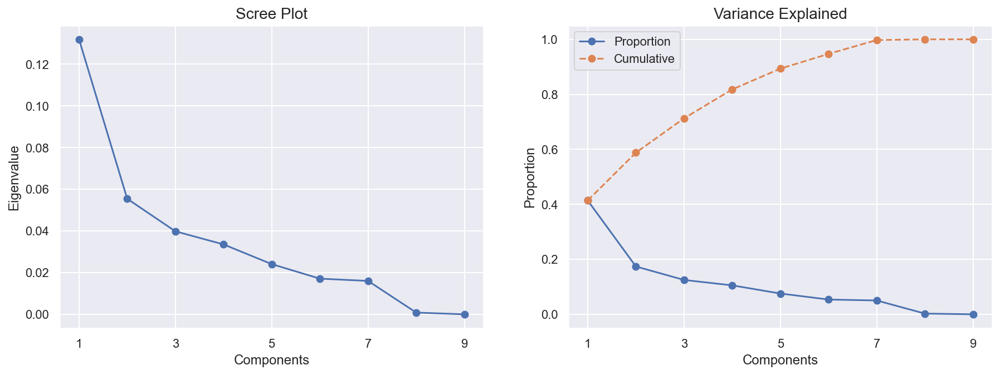

In [118]:
# figure and axes
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
# plots
ax1.plot(pca.explained_variance_, marker=".", markersize=12)
ax2.plot(pca.explained_variance_ratio_, marker=".", markersize=12, label="Proportion")
ax2.plot(np.cumsum(pca.explained_variance_ratio_), marker=".", markersize=12, linestyle="--", label="Cumulative")
# customizations
ax2.legend()
ax1.set_title("Scree Plot", fontsize=14)
ax2.set_title("Variance Explained", fontsize=14)
ax1.set_ylabel("Eigenvalue")
ax2.set_ylabel("Proportion")
ax1.set_xlabel("Components")
ax2.set_xlabel("Components")
ax1.set_xticks(range(0, pca.n_components_, 2))
ax1.set_xticklabels(range(1, pca.n_components_ + 1, 2))
ax2.set_xticks(range(0, pca.n_components_, 2))
ax2.set_xticklabels(range(1, pca.n_components_ + 1, 2))
plt.show()

<a class="anchor" id="fifth-bullet">
 
# 5. Clustering 

<a class="anchor" id="A.t">
 
### Hierarchical clustering

In [131]:
# setting distance_threshold=0 and n_clusters=None ensures we compute the full tree
linkage = 'ward'
distance = 'euclidean'
hclust1 = AgglomerativeClustering(linkage=linkage, affinity=distance, distance_threshold=0, n_clusters=None)
hclust1.fit_predict(data_normalized[metric_features])

array([6408, 6625, 7049, ...,    3,    1,    0], dtype=int64)

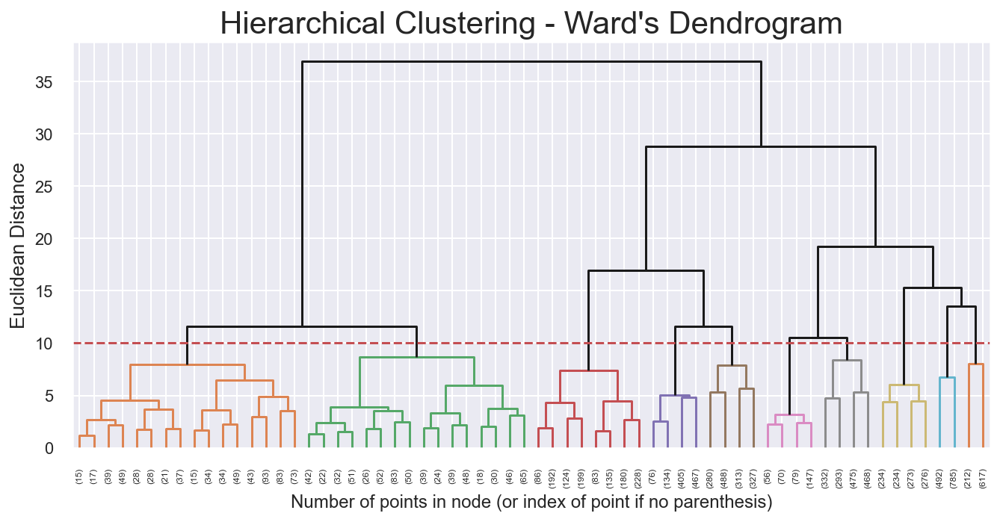

In [132]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_agglomerative_dendrogram.html#sphx-glr-auto-examples-cluster-plot-agglomerative-dendrogram-py

# create the counts of samples under each node (number of points being merged)
counts = np.zeros(hclust1.children_.shape[0])
n_samples = len(hclust1.labels_)

# hclust.children_ contains the observation ids that are being merged together
# At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
for i, merge in enumerate(hclust1.children_):
    # track the number of observations in the current cluster being formed
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            # If this is True, then we are merging an observation
            current_count += 1  # leaf node
        else:
            # Otherwise, we are merging a previously formed cluster
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count

# the hclust.children_ is used to indicate the two points/clusters being merged (dendrogram's u-joins)
# the hclust.distances_ indicates the distance between the two points/clusters (height of the u-joins)
# the counts indicate the number of points being merged (dendrogram's x-axis)
linkage_matrix = np.column_stack(
    [hclust1.children_, hclust1.distances_, counts]
).astype(float)

# Plot the corresponding dendrogram
sns.set()
fig = plt.figure(figsize=(11,5))
# The Dendrogram parameters need to be tuned
y_threshold = 10
dendrogram(linkage_matrix, truncate_mode='level', p=5, color_threshold=y_threshold, above_threshold_color='k')
plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
plt.title(f'Hierarchical Clustering - {linkage.title()}\'s Dendrogram', fontsize=21)
plt.xlabel('Number of points in node (or index of point if no parenthesis)')
plt.ylabel(f'{distance.title()} Distance', fontsize=13)
plt.show()

In [133]:
# 9 cluster solution
linkage = 'ward'
distance = 'euclidean'
hc9lust = AgglomerativeClustering(linkage=linkage, affinity=distance, n_clusters=8)
hc9_labels = hc9lust.fit_predict(data_normalized[metric_features])

In [134]:
# Characterizing the final clusters with the standardized numerical data
hc_normalized = pd.concat((data_normalized[metric_features], pd.Series(hc9_labels, name='labels_hc')), axis=1)
hc_norm_labeled = hc_normalized.groupby('labels_hc').mean()
hc_norm_labeled['Labels_2hc'] = hc_norm_labeled.index 
hc_norm_labeled

,CMV,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Annual_profit,Customer_lifetime,Yearly_Salary,Labels_2hc
labels_hc,,,,,,,,,,
0.0,0.383018,0.525976,0.204052,0.399508,0.178720,0.194255,0.268796,0.499506,0.466401,0.0
1.0,0.378723,0.509214,0.209616,0.414095,0.188782,0.197496,0.274784,0.498628,0.462228,1.0
2.0,0.397266,0.515754,0.214744,0.401293,0.186091,0.201475,0.279577,0.491916,0.461393,2.0
3.0,0.385898,0.521087,0.205568,0.407026,0.181814,0.191860,0.270882,0.502083,0.485017,3.0
4.0,0.385132,0.511886,0.212703,0.406807,0.188632,0.196804,0.276808,0.488698,0.465542,4.0
5.0,0.384208,0.509840,0.218206,0.411535,0.187153,0.193865,0.282706,0.507154,0.466980,5.0
6.0,0.389451,0.518960,0.212877,0.403208,0.186024,0.193415,0.277957,0.503348,0.461233,6.0
7.0,0.380300,0.506775,0.208456,0.413988,0.179911,0.206727,0.272328,0.496022,0.465153,7.0


(array([0, 1, 2, 3, 4, 5, 6, 7, 8]),
 [Text(0, 0, 'CMV'),
  Text(1, 0, 'PremMotor'),
  Text(2, 0, 'PremHousehold'),
  Text(3, 0, 'PremHealth'),
  Text(4, 0, 'PremLife'),
  Text(5, 0, 'PremWork'),
  Text(6, 0, 'Annual_profit'),
  Text(7, 0, 'Customer_lifetime'),
  Text(8, 0, 'Yearly_Salary')])

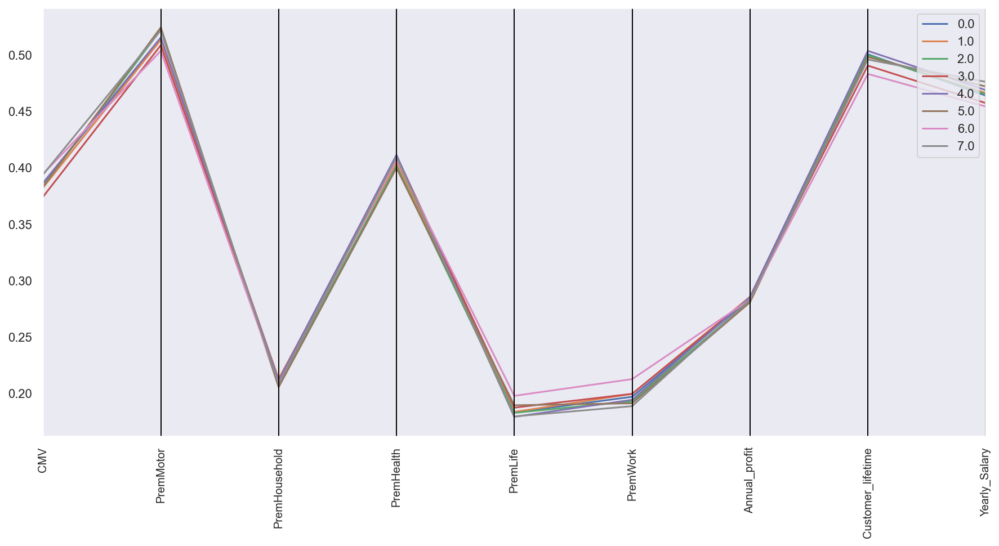

In [132]:
plt.figure(figsize=(15, 7))
pd.plotting.parallel_coordinates(hc_norm_labeled, class_column = 'Labels_2hc', color=sns.color_palette())
plt.xticks(fontsize=10, rotation=90)

The hc clustering algorithm gave us 9 clusters that look almost the same so they're difficult if not impossible to interrupt and do the marketing approach for the insurrance company.

<a class="anchor" id="A.t">
    
### Kmeans Clustering

In [164]:
range_clusters = range(1, 11)
inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(data_normalized[metric_features])
    inertia.append(kmclust.inertia_)

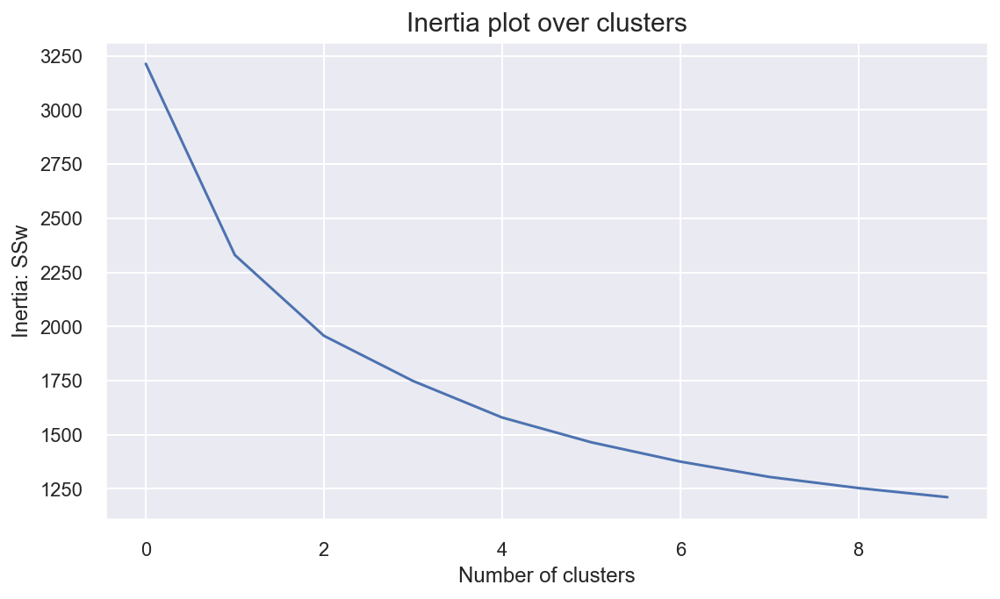

In [165]:
# The inertia plot
plt.figure(figsize=(9,5))
plt.plot(inertia)
ax.set_xlim(1, 24)
plt.ylabel("Inertia: SSw")
plt.xlabel("Number of clusters")
plt.title("Inertia plot over clusters", size=15)
plt.show()

For n_clusters = 2, the average silhouette_score is : 0.2713933426139156
For n_clusters = 3, the average silhouette_score is : 0.20402449508829462
For n_clusters = 4, the average silhouette_score is : 0.19186872099726726
For n_clusters = 5, the average silhouette_score is : 0.18333071847491234
For n_clusters = 6, the average silhouette_score is : 0.18371903038069878
For n_clusters = 7, the average silhouette_score is : 0.18313959773951943
For n_clusters = 8, the average silhouette_score is : 0.18119007193108358
For n_clusters = 9, the average silhouette_score is : 0.16973357690722027
For n_clusters = 10, the average silhouette_score is : 0.15544610257043517


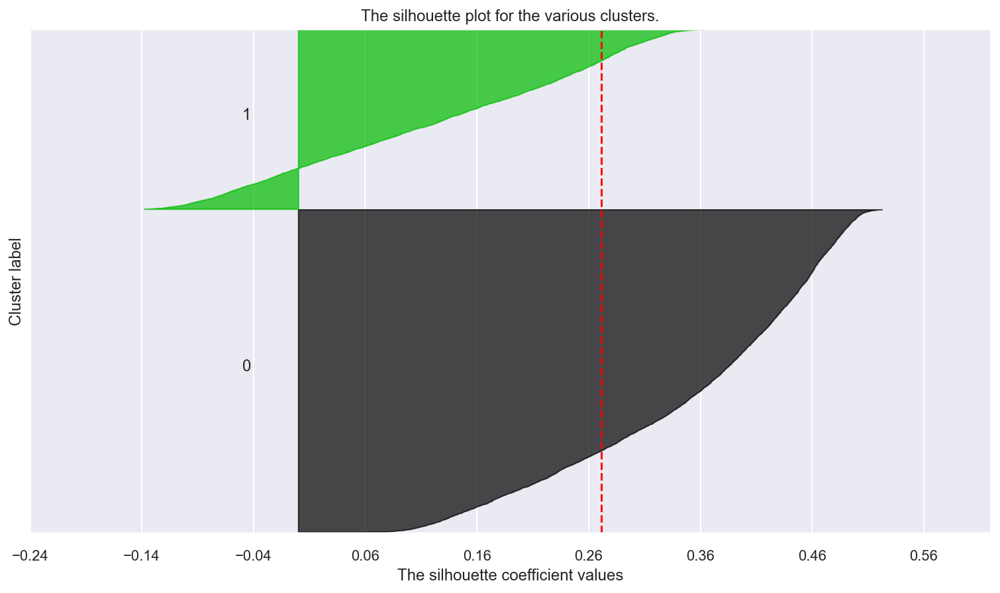

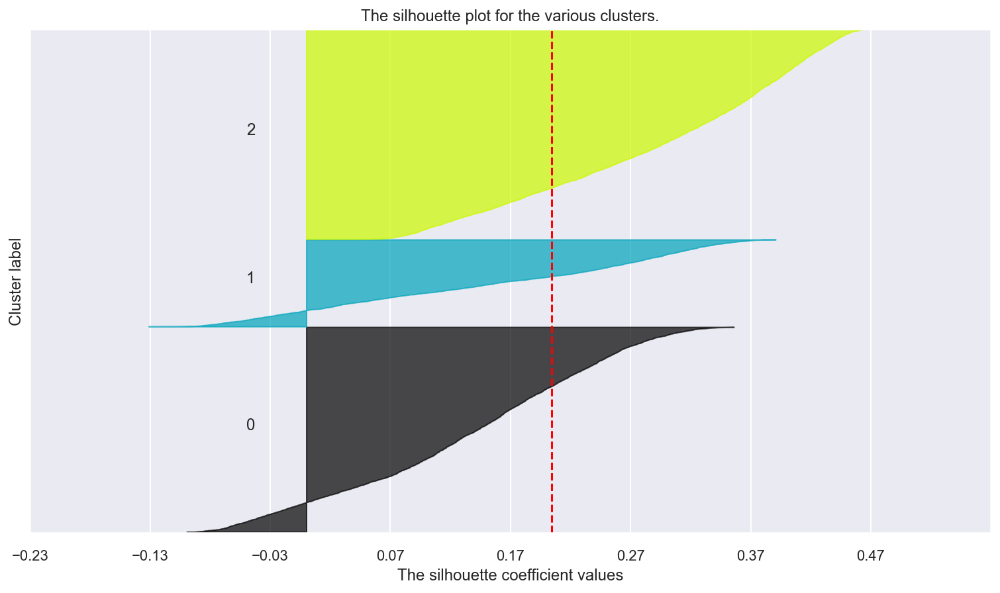

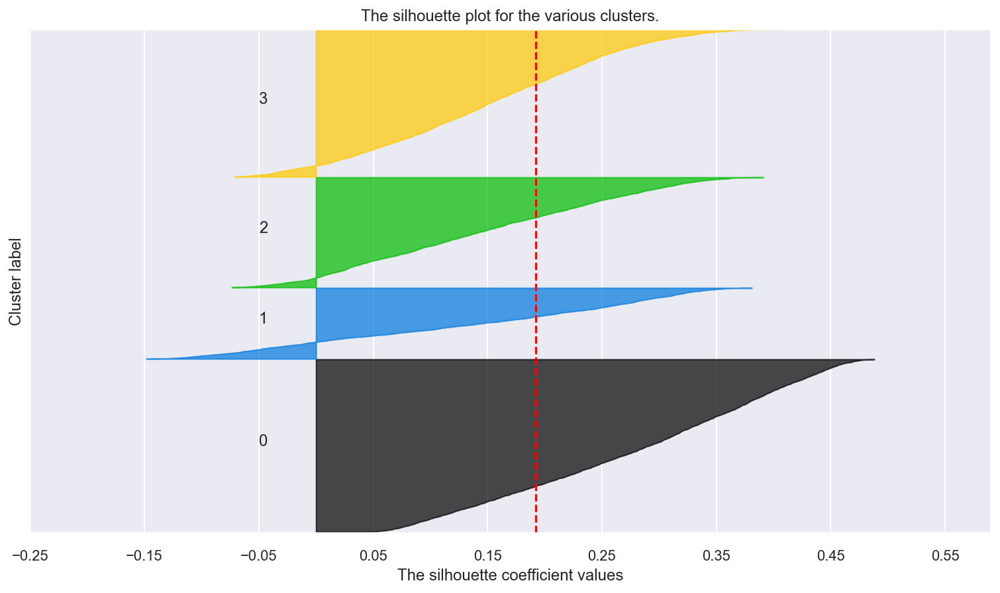

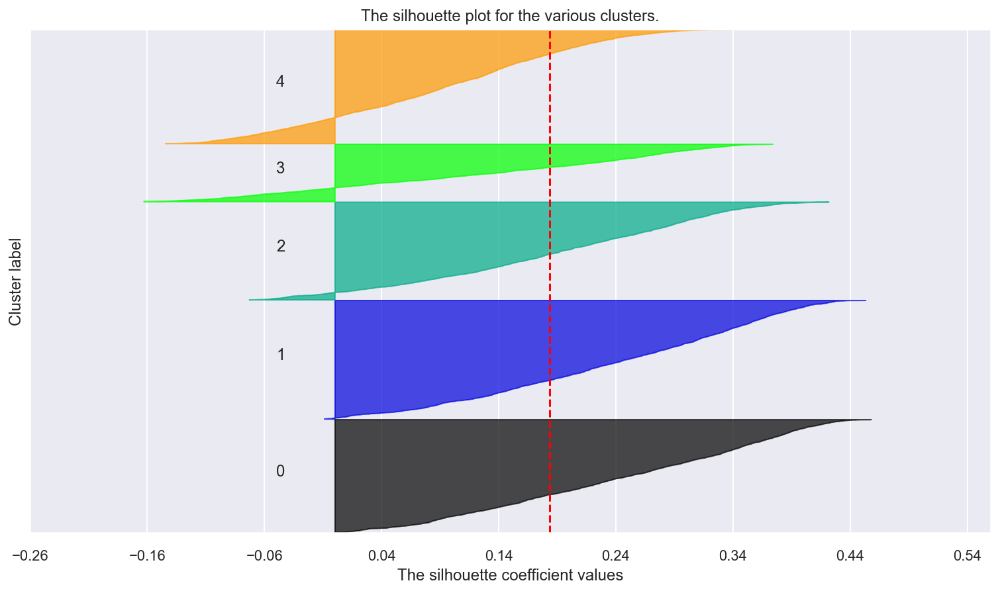

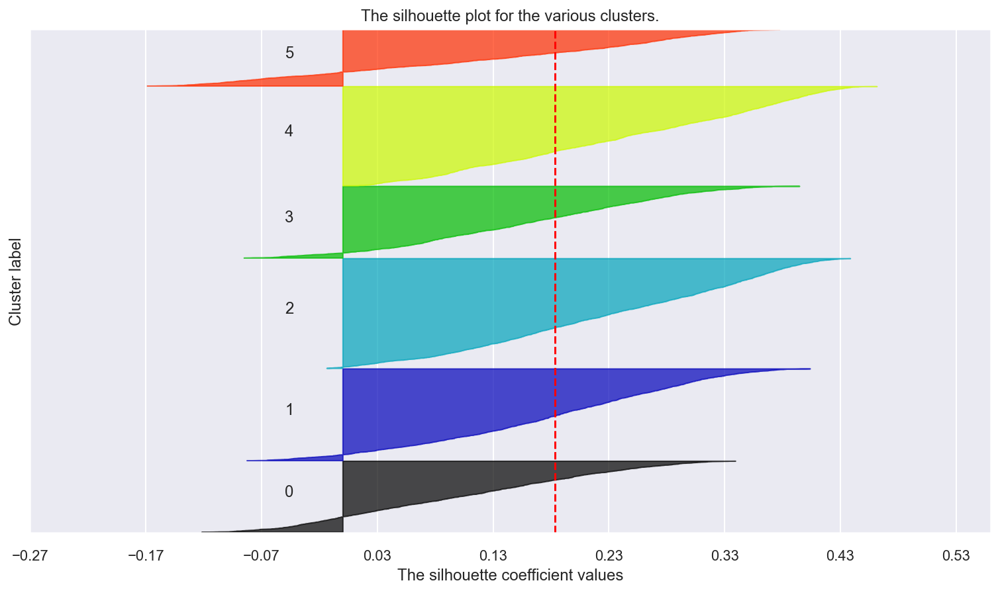

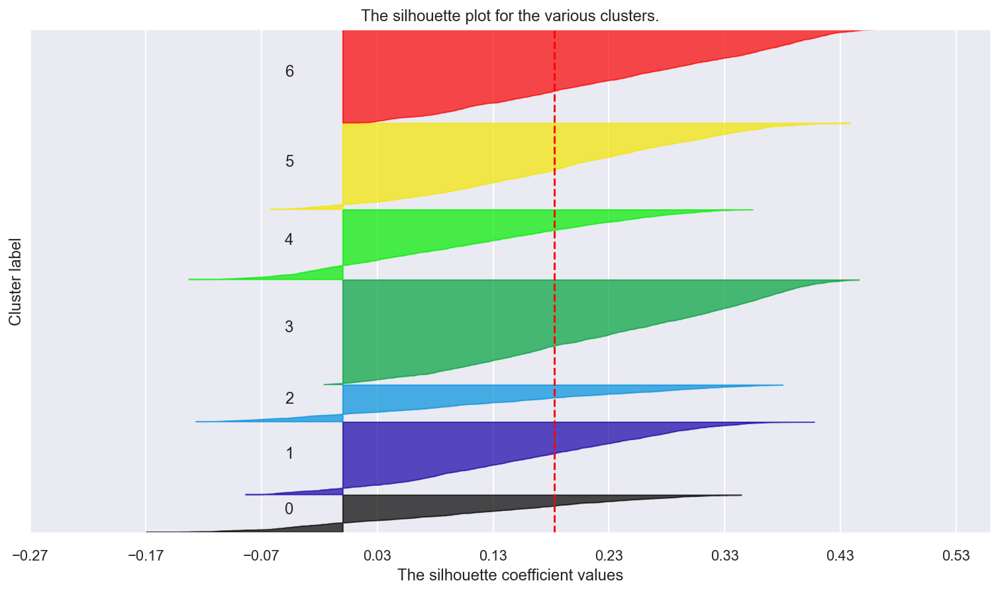

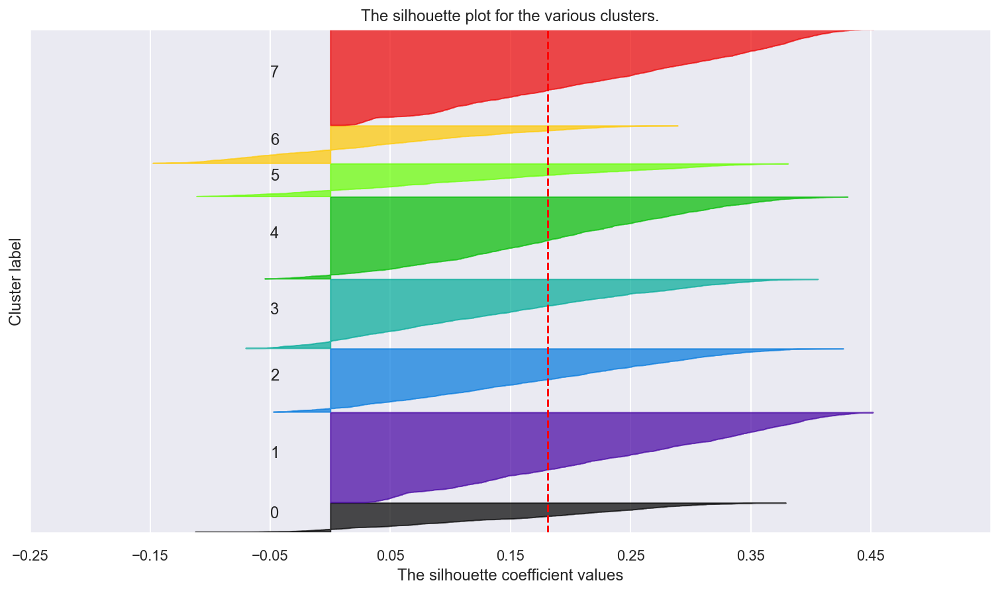

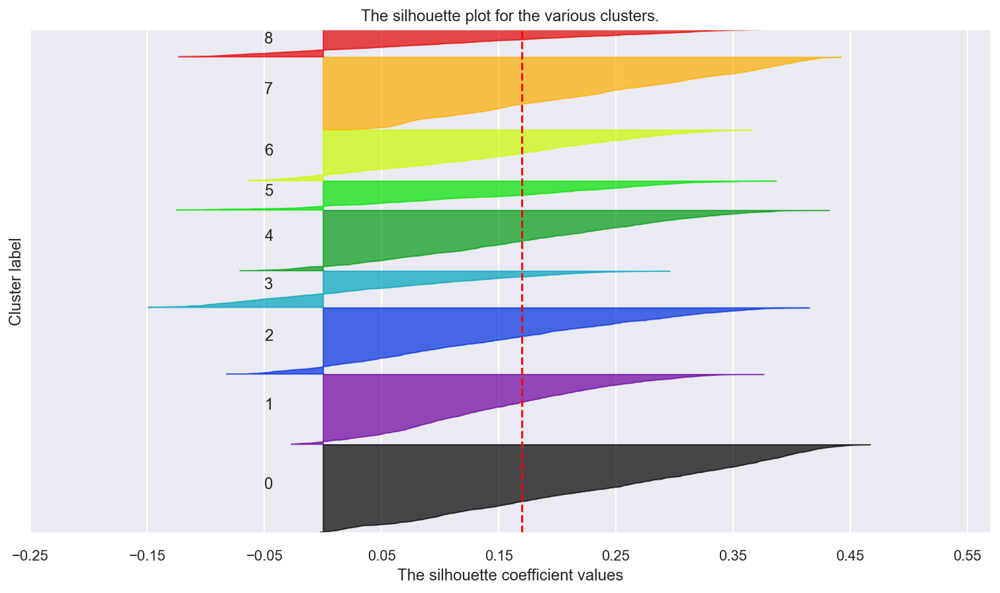

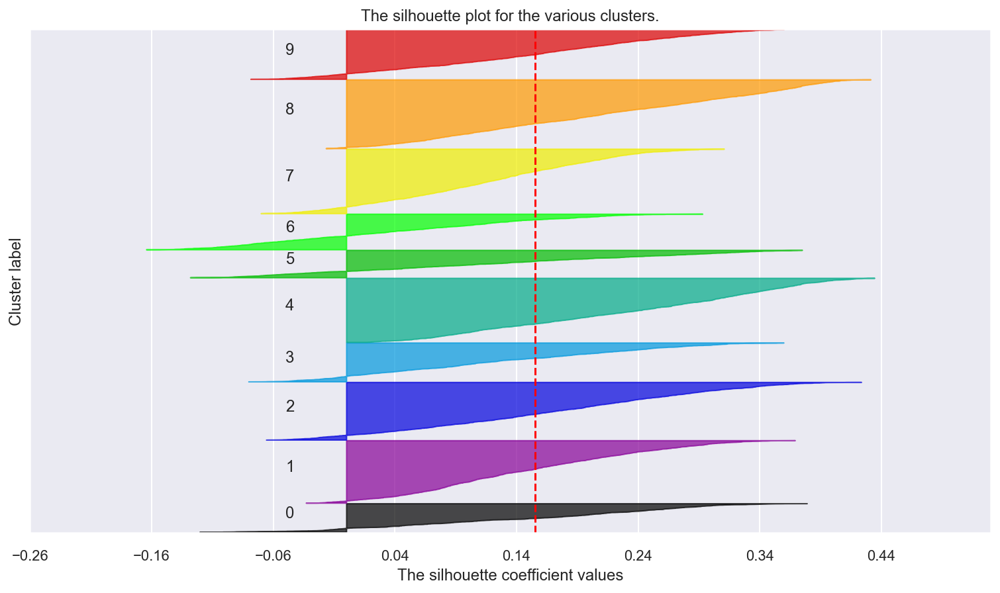

In [166]:
# Storing average silhouette metric
avg_silhouette = []
for nclus in range_clusters:
    # Skip nclus == 1
    if nclus == 1:
        continue
    
    # Create a figure
    fig = plt.figure(figsize=(13, 7))

    # Initialize the KMeans object with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
    cluster_labels = kmclust.fit_predict(data_normalized[metric_features])

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed clusters
    silhouette_avg = silhouette_score(data_normalized[metric_features], cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is : {silhouette_avg}")

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(data_normalized[metric_features], cluster_labels)

    y_lower = 10
    for i in range(nclus):
        # Aggregate the silhouette scores for samples belonging to cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        
        # Get y_upper to demarcate silhouette y range size
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        
        # Filling the silhouette
        color = cm.nipy_spectral(float(i) / nclus)
        plt.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    plt.title("The silhouette plot for the various clusters.")
    plt.xlabel("The silhouette coefficient values")
    plt.ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    plt.axvline(x=silhouette_avg, color="red", linestyle="--")
    
    # The silhouette coefficient can range from -1, 1
    xmin, xmax = np.round(sample_silhouette_values.min() -0.1, 2), np.round(sample_silhouette_values.max() + 0.1, 2)
    plt.xlim([xmin, xmax])
    
    # The (nclus+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    plt.ylim([0, len(data_normalized[metric_features]) + (nclus + 1) * 10])

    plt.yticks([])  # Clear the yaxis labels / ticks
    plt.xticks(np.arange(xmin, xmax, 0.1))

In [167]:
#Having run the kmeans and Silhouette analysis,the elbow and scores of silhouette suggest 2, 

number_clusters = 2
kmclust = KMeans(n_clusters=number_clusters, init='k-means++', n_init=15, random_state=1)
km_labels = kmclust.fit_predict(data_normalized[metric_features])
km_labels

array([0, 1, 1, ..., 0, 1, 0])

In [138]:
# Characterizing the final clusters with the standardized numerical data
km_normalized = pd.concat((data_normalized[metric_features], pd.Series(km_labels, name='labels')), axis=1)
km_norm_labeled = km_normalized.groupby('labels').mean()
km_norm_labeled['Labels_2'] = km_norm_labeled.index 
km_norm_labeled

,CMV,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Annual_profit,Customer_lifetime,Yearly_Salary,Labels_2
labels,,,,,,,,,,
0.0,0.383277,0.517069,0.208356,0.406165,0.185791,0.194549,0.273162,0.498938,0.464075,0.0
1.0,0.386357,0.514680,0.212462,0.407234,0.182003,0.198983,0.277141,0.498457,0.469514,1.0


(array([0, 1, 2, 3, 4, 5, 6, 7, 8]),
 [Text(0, 0, 'CMV'),
  Text(1, 0, 'PremMotor'),
  Text(2, 0, 'PremHousehold'),
  Text(3, 0, 'PremHealth'),
  Text(4, 0, 'PremLife'),
  Text(5, 0, 'PremWork'),
  Text(6, 0, 'Annual_profit'),
  Text(7, 0, 'Customer_lifetime'),
  Text(8, 0, 'Yearly_Salary')])

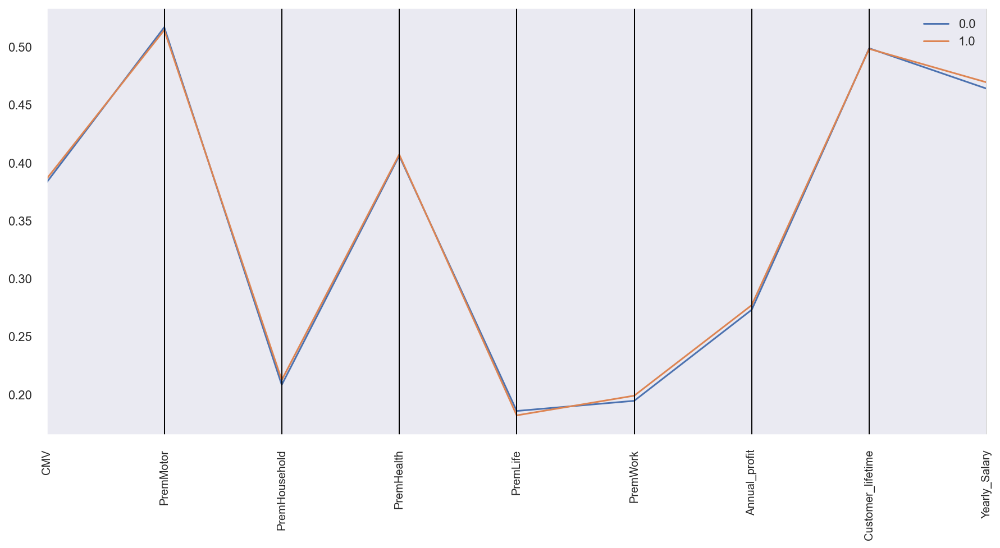

In [168]:
plt.figure(figsize=(15, 7))
pd.plotting.parallel_coordinates(km_norm_labeled, class_column = 'Labels_2', color=sns.color_palette())
plt.xticks(fontsize=10, rotation=90)

Using Kmeans the clusters almost look alike. so we cant do the prfiling and the customers of each cluster.

### Kmeans with HC clustering 

In [119]:
#Run Kmeans with 50 n_clusters 
kmclust_hier = KMeans(n_clusters= 50, init='k-means++', n_init=15, random_state=1)

In [120]:
km_labels_hier = kmclust_hier.fit_predict(data_normalized[metric_features])
km_labels_hier

array([35, 29, 15, ..., 13, 38, 13])

In [121]:
#Assign cluster labels to normalized data
km_hier_normalized = pd.concat((data_normalized[metric_features], pd.Series(km_labels_hier, name='Km_Label', 
                                                                   index=data_normalized[metric_features].index.tolist())), 
                               axis=1)
km_hier_normalized = km_hier_normalized.groupby('Km_Label').mean()
km_hier_normalized

,CMV,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Annual_profit,Customer_lifetime,Yearly_Salary
Km_Label,,,,,,,,,
0,0.314568,0.575046,0.125828,0.429451,0.133766,0.153495,0.197080,0.519222,0.602730
1,0.326145,0.202491,0.251367,0.442225,0.726497,0.236630,0.303475,0.241104,0.196047
2,0.257096,0.663101,0.120792,0.356658,0.098127,0.114868,0.193254,0.275822,0.365973
3,0.436124,0.561791,0.263603,0.317566,0.199470,0.185204,0.327174,0.854497,0.555382
4,0.273894,0.238859,0.686327,0.407217,0.266169,0.266385,0.706184,0.604938,0.632799
5,0.282263,0.524860,0.137500,0.469451,0.158570,0.178188,0.210254,0.843247,0.419992
6,0.349961,0.350904,0.164063,0.395844,0.256401,0.557109,0.232230,0.437860,0.632538
7,0.542424,0.835195,0.084981,0.186353,0.056078,0.077056,0.160867,0.843210,0.500328
8,0.443403,0.482334,0.205445,0.532481,0.131752,0.139970,0.273695,0.432718,0.232103


In [122]:
km_hier_normalized['Km_Label'] = km_hier_normalized.index

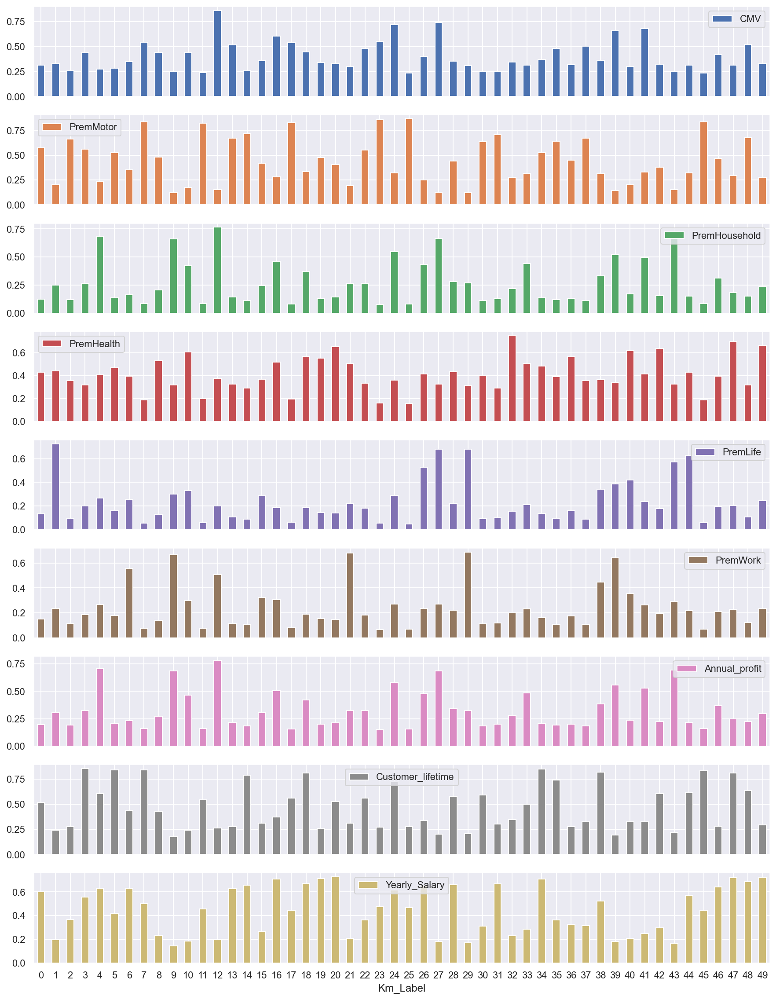

In [123]:
axes = km_hier_normalized.plot.bar(x='Km_Label',y=metric_features, rot=0, subplots=True, figsize=(15,20), 
                                   title=['','','','','','','','',''])
axes[1].legend(loc=2)  

In [124]:
del km_hier_normalized['Km_Label']

In [125]:
km_hier_normalized.columns

Index(['CMV', 'PremMotor', 'PremHousehold', 'PremHealth', 'PremLife',
       'PremWork', 'Annual_profit', 'Customer_lifetime', 'Yearly_Salary'],
      dtype='object')

### Kmeans with raw Data

In [126]:
km_hier_raw = pd.concat((df_central[metric_features], pd.Series(km_labels_hier, name='Km_Label', 
                                                                   index=df_central[metric_features].index.tolist())), 
                               axis=1)
km_hier_raw = km_hier_raw.groupby('Km_Label').mean()
km_hier_raw

,CMV,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Annual_profit,Customer_lifetime,Yearly_Salary
Km_Label,,,,,,,,,
0,102.013228,334.781867,90.212025,178.006203,27.146519,28.137468,658.284082,29.018987,37903.162025
1,120.713529,115.224314,255.044608,183.363431,178.452843,49.876471,781.961667,21.509804,15024.823529
2,9.185775,386.675528,83.599648,147.475810,18.048838,18.036725,653.836549,22.447183,24584.180282
3,298.348286,326.970476,271.111190,131.080286,43.918762,36.428952,809.509667,38.071429,35239.577143
4,36.318400,136.656800,826.147333,168.680800,60.944933,57.656933,1250.086800,31.333333,39594.720000
5,49.835051,305.205707,105.537121,194.782475,33.478232,34.594394,673.597929,37.767677,27623.078788
6,159.180370,202.688444,140.414074,163.910741,58.451407,133.678519,699.143185,26.822222,39580.035556
7,470.042033,488.095367,36.579833,76.048133,7.315100,8.149300,616.187733,37.766667,32142.448000
8,310.104903,280.144054,194.748842,221.218031,26.632317,24.600656,747.343900,26.683398,17053.204633


In [127]:
km_hier_normalized['Km_Label'] = km_hier_normalized.index

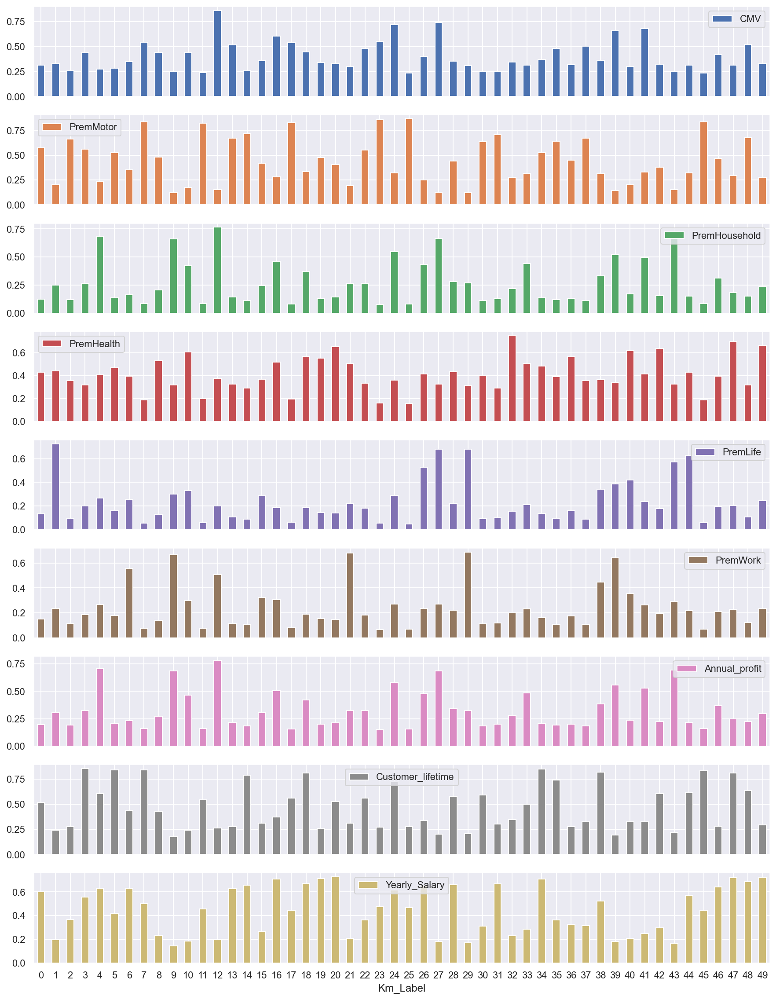

In [128]:
axes = km_hier_normalized.plot.bar(x='Km_Label',y=metric_features, rot=0, subplots=True, figsize=(15,20), 
                                   title=['','','','','','','','',''])
axes[1].legend(loc=2)  

In [129]:
del km_hier_normalized['Km_Label']

In [130]:
km_hier_normalized.columns

Index(['CMV', 'PremMotor', 'PremHousehold', 'PremHealth', 'PremLife',
       'PremWork', 'Annual_profit', 'Customer_lifetime', 'Yearly_Salary'],
      dtype='object')

### Kmeans with encoded Data

In [131]:
km_hier_encoded = pd.concat((ohc_df, pd.Series(km_labels_hier, name='Km_Label', index=ohc_df.index.tolist())), axis=1)
km_hier_encoded = km_hier_encoded.groupby('Km_Label').mean()
km_hier_encoded

,EducDeg_0.0,EducDeg_1.0,EducDeg_2.0,EducDeg_3.0,gen_Baby Boomer,gen_Generation X,gen_Generation Y,gen_Generation Z,gen_The Silent Generation,ClientValue_1
Km_Label,,,,,,,,,,
0,0.303797,0.037975,0.588608,0.069620,0.699367,0.136076,0.012658,0.000000,0.151899,0.648734
1,0.431373,0.382353,0.176471,0.009804,0.009804,0.343137,0.637255,0.009804,0.000000,0.725490
2,0.242958,0.070423,0.591549,0.095070,0.130282,0.616197,0.253521,0.000000,0.000000,0.447183
3,0.404762,0.119048,0.452381,0.023810,0.747619,0.200000,0.000000,0.000000,0.052381,0.895238
4,0.586667,0.280000,0.133333,0.000000,0.546667,0.186667,0.013333,0.000000,0.253333,0.626667
5,0.414141,0.080808,0.449495,0.055556,0.267677,0.717172,0.010101,0.000000,0.005051,0.545455
6,0.518519,0.207407,0.259259,0.014815,0.725926,0.066667,0.037037,0.000000,0.170370,0.770370
7,0.203333,0.026667,0.633333,0.136667,0.390000,0.583333,0.003333,0.000000,0.023333,1.000000
8,0.270270,0.054054,0.586873,0.088803,0.003861,0.389961,0.606178,0.000000,0.000000,0.949807


### HClustering with the 50 kmeans clusters

In [132]:
linkage = 'ward'
distance = 'euclidean'
hc = AgglomerativeClustering(linkage=linkage, affinity=distance, n_clusters=None, distance_threshold=0.000001)
hc.fit_predict(km_hier_normalized)

array([42, 43, 48, 40, 35, 39, 41, 44, 49, 47, 32, 45, 24, 23, 21, 31, 30,
       34, 36, 20, 46, 25, 17, 29, 27, 14, 28, 15, 19, 22, 10, 26, 37, 33,
       38, 12, 18, 16, 11,  5,  9, 13,  8,  6,  7,  3,  4,  2,  1,  0],
      dtype=int64)

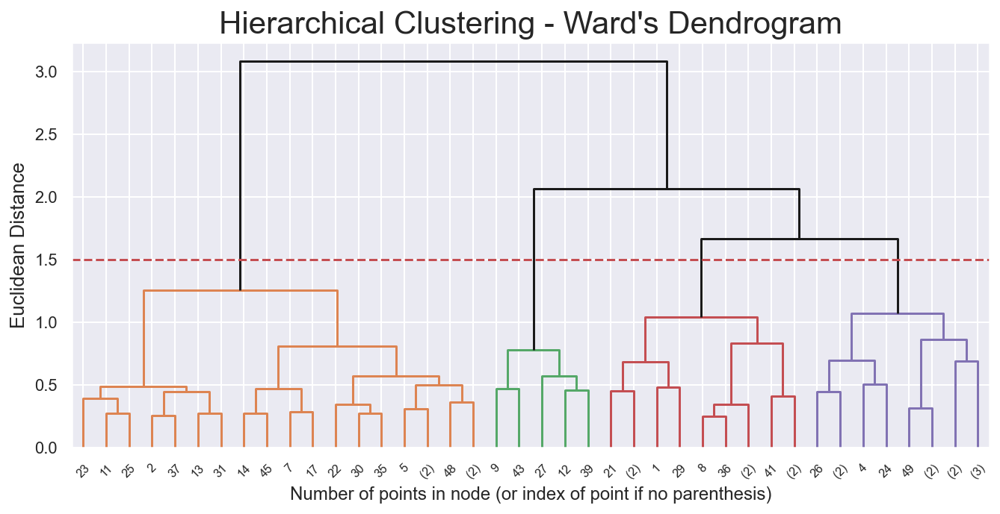

In [133]:

# Create the counts of samples under each node (number of points being merged)
counts = np.zeros(hc.children_.shape[0])
n_samples = len(hc.labels_)

# hclust.children_ contains the observation ids that are being merged together
# At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
for i, merge in enumerate(hc.children_):
    # track the number of observations in the current cluster being formed
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            # If this is True, then we are merging an observation
            current_count += 1  # leaf node
        else:
            # Otherwise, we are merging a previously formed cluster
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count

linkage_matrix = np.column_stack([hc.children_, hc.distances_, counts]).astype(float)

# Plot the corresponding dendrogram
sns.set()
fig = plt.figure(figsize=(11,5))
# The Dendrogram parameters need to be tuned. Already have an idea of 3 or 4 clusters bc of Kmeans.
y_threshold = 1.5
#Build the dendogram
dendrogram(linkage_matrix, truncate_mode='level', p=5, color_threshold=y_threshold, above_threshold_color='k')
plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
plt.title(f'Hierarchical Clustering - {linkage.title()}\'s Dendrogram', fontsize=21)
plt.xlabel('Number of points in node (or index of point if no parenthesis)')
plt.ylabel(f'{distance.title()} Distance', fontsize=13)
plt.show()

In [134]:
# given the dendogram, define the clusters. 
hclust=AgglomerativeClustering(linkage='ward',affinity='euclidean',n_clusters=3)
hc_labels=hclust.fit_predict(km_hier_normalized)
hc_labels1=hclust.fit(km_hier_normalized)

# print(hc_labels.labels_)
hc_labels

array([1, 0, 1, 1, 0, 1, 0, 1, 0, 2, 0, 1, 2, 1, 1, 0, 0, 1, 0, 0, 0, 0,
       1, 1, 0, 1, 0, 2, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 0, 2, 0, 0, 0, 2,
       0, 1, 0, 0, 1, 0], dtype=int64)

In [135]:
df1 = pd.DataFrame(hc_labels)

In [137]:
df1.value_counts()

0    25
1    20
2     5
dtype: int64

In [138]:
#characterization with normalized data per cluster-HC
labeled_hc_normalized = pd.concat((km_hier_normalized, pd.Series(hc_labels, name='hc_labels')), axis=1)
#labeled_hc_normalized
hier_labeled_normalized = labeled_hc_normalized.groupby('hc_labels').mean()
hier_labeled_normalized['hc_labels'] = hier_labeled_normalized.index
hier_labeled_normalized

,CMV,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Annual_profit,Customer_lifetime,Yearly_Salary,hc_labels
hc_labels,,,,,,,,,,
0,0.386954,0.315457,0.296411,0.508605,0.293752,0.290396,0.352639,0.441121,0.455787,0
1,0.380839,0.680587,0.135173,0.315524,0.107710,0.122508,0.207345,0.574304,0.505297,1
2,0.552910,0.138667,0.657863,0.339257,0.429329,0.474982,0.681471,0.212297,0.173677,2


(array([0, 1, 2, 3, 4, 5, 6, 7, 8]),
 [Text(0, 0, 'CMV'),
  Text(1, 0, 'PremMotor'),
  Text(2, 0, 'PremHousehold'),
  Text(3, 0, 'PremHealth'),
  Text(4, 0, 'PremLife'),
  Text(5, 0, 'PremWork'),
  Text(6, 0, 'Annual_profit'),
  Text(7, 0, 'Customer_lifetime'),
  Text(8, 0, 'Yearly_Salary')])

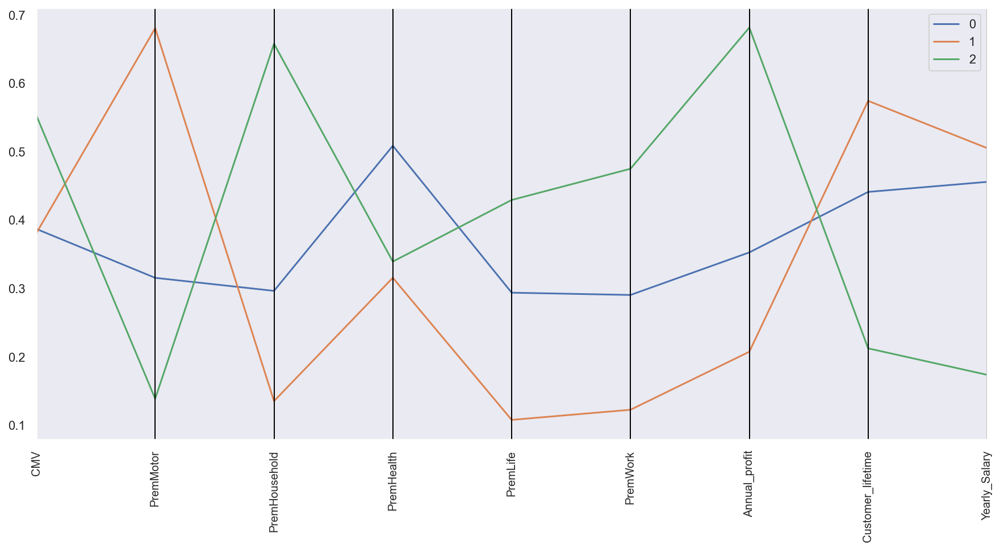

In [139]:
plt.figure(figsize=(15, 7))
pd.plotting.parallel_coordinates(hier_labeled_normalized, class_column = 'hc_labels', color=sns.color_palette())
plt.xticks(fontsize=10, rotation=90)

In [140]:
#characterization of clusters with not normalized data
Labeled_hc_data_raw = pd.concat((km_hier_raw, pd.Series(hc_labels, name='hc_labels')), axis=1)
#try printing Labeled_hc_data without grouping
hc_data_raw = Labeled_hc_data_raw.groupby('hc_labels').mean()
hc_data_raw


,CMV,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Annual_profit,Customer_lifetime,Yearly_Salary
hc_labels,,,,,,,,,
0,218.929738,181.798354,314.187582,211.203955,67.986021,63.935638,839.111550,26.910272,29636.735216
1,209.053790,396.980453,102.482361,130.224099,20.495114,20.034529,670.216556,30.506195,32421.995116
2,486.979709,77.610343,788.773920,140.177695,102.594705,112.202976,1221.359639,20.732021,13766.381606


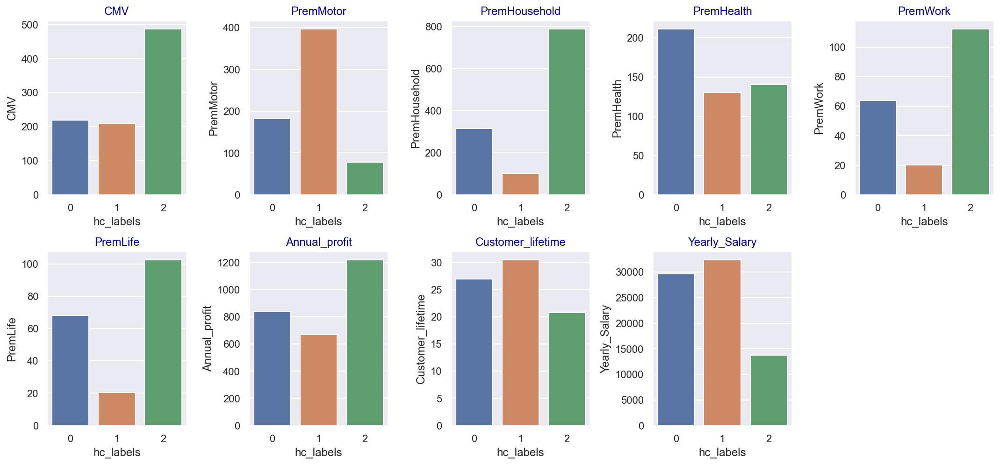

In [141]:
#visualization of the metric features of each cluster 
features=['CMV', 'PremMotor',
       'PremHousehold', 'PremHealth', 'PremWork','PremLife',
       'Annual_profit', 'Customer_lifetime',
       'Yearly_Salary']
plt.figure(figsize=(15,10))
for i,j in enumerate(features):
    plt.subplot(3,5,i+1)
    sns.barplot(hc_data_raw.index,hc_data_raw[j])
    plt.title(j,fontdict={'color':'darkblue'})
plt.tight_layout()
plt.show()

In [142]:
#characterization of clusters with not normalized data
Labeled_hc_encoded = pd.concat((km_hier_encoded, pd.Series(hc_labels, name='hc_labels')), axis=1)
#try printing Labeled_hc_data without grouping
hc_data_encoded = Labeled_hc_encoded.groupby('hc_labels').mean()
hc_data_encoded['hc_labels'] = hc_data_encoded.index
hc_data_encoded

,EducDeg_0.0,EducDeg_1.0,EducDeg_2.0,EducDeg_3.0,gen_Baby Boomer,gen_Generation X,gen_Generation Y,gen_Generation Z,gen_The Silent Generation,ClientValue_1,hc_labels
hc_labels,,,,,,,,,,,
0,0.456518,0.186979,0.331740,0.024763,0.304422,0.212580,0.309111,0.003846,0.170040,0.779784,0
1,0.279092,0.049221,0.571319,0.100369,0.409386,0.426308,0.075280,0.000000,0.089025,0.700023,1
2,0.361992,0.557559,0.080449,0.000000,0.022527,0.250501,0.693217,0.033755,0.000000,0.788379,2


In [143]:
hc_data_encoded.columns

Index(['EducDeg_0.0', 'EducDeg_1.0', 'EducDeg_2.0', 'EducDeg_3.0',
       'gen_Baby Boomer', 'gen_Generation X ', 'gen_Generation Y ',
       'gen_Generation Z', 'gen_The Silent Generation', 'ClientValue_1',
       'hc_labels'],
      dtype='object')

In [144]:
Demo=['EducDeg_0.0', 'EducDeg_1.0', 'EducDeg_2.0',
       'EducDeg_3.0', 'ClientValue_1']

genration=['gen_Baby Boomer', 'gen_Generation X ', 'gen_Generation Y ',
       'gen_Generation Z', 'gen_The Silent Generation']

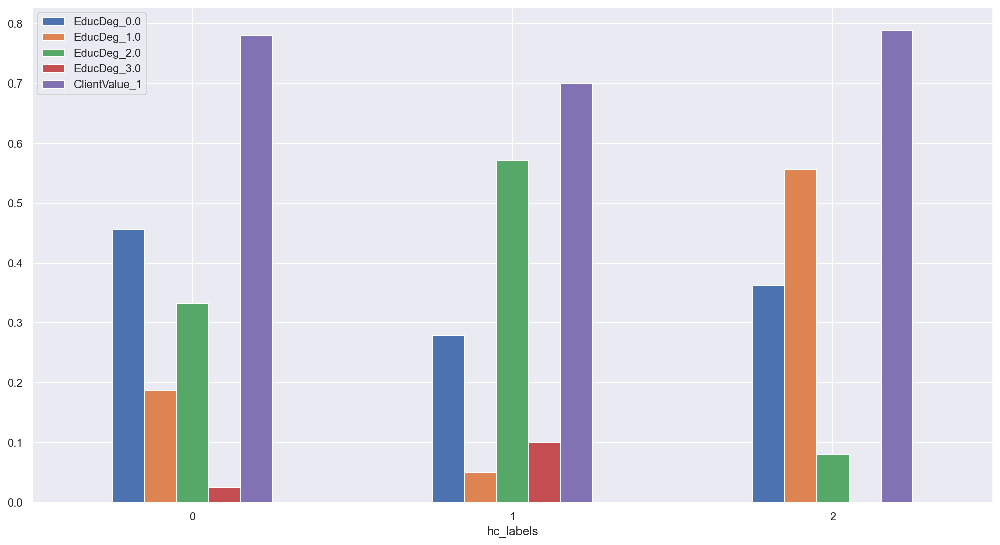

In [145]:
#visualization of the demographic features of each cluster 
axes = hc_data_encoded.plot.bar(x='hc_labels',y=Demo, rot=0, figsize=(17,9))

In [146]:
df_central['gen'].value_counts()

Generation X             3411
Baby Boomer              3342
Generation Y             2095
The Silent Generation    1207
Generation Z               30
Name: gen, dtype: int64

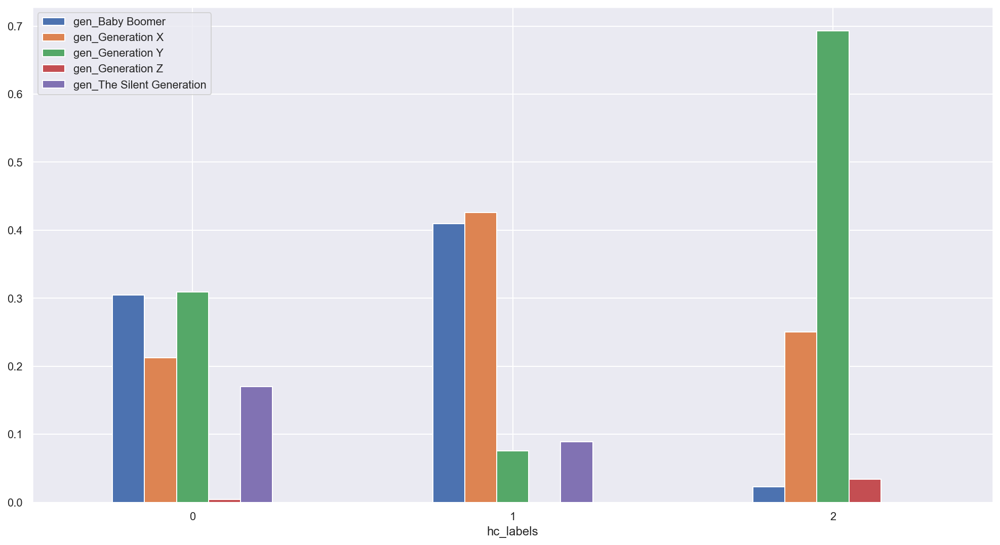

In [147]:
#visualization of the generation features of each cluster 
axes = hc_data_encoded.plot.bar(x='hc_labels',y=genration, rot=0, figsize=(17,9))

<a class="anchor" id="A.t">
    
### Self Organizing Maps

In [201]:
# This som implementation does not have a random seed parameter
# We're going to set it up ourselves
import sompy
from sompy.visualization.mapview import View2D
from sompy.visualization.bmuhits import BmuHitsView
from sompy.visualization.hitmap import HitMapView
np.random.seed(42)

sm1 = sompy.SOMFactory().build(
    data_normalized[metric_features].values, 
    mapsize=[10, 10],  # NEEDS TO BE A LIST
    initialization='random', 
    neighborhood='gaussian',
    training='batch',
    lattice='hexa',
    component_names=metric_features
)
sm1.train(n_job=4, verbose='info', train_rough_len=100, train_finetune_len=100)

ModuleNotFoundError: No module named 'sompy'

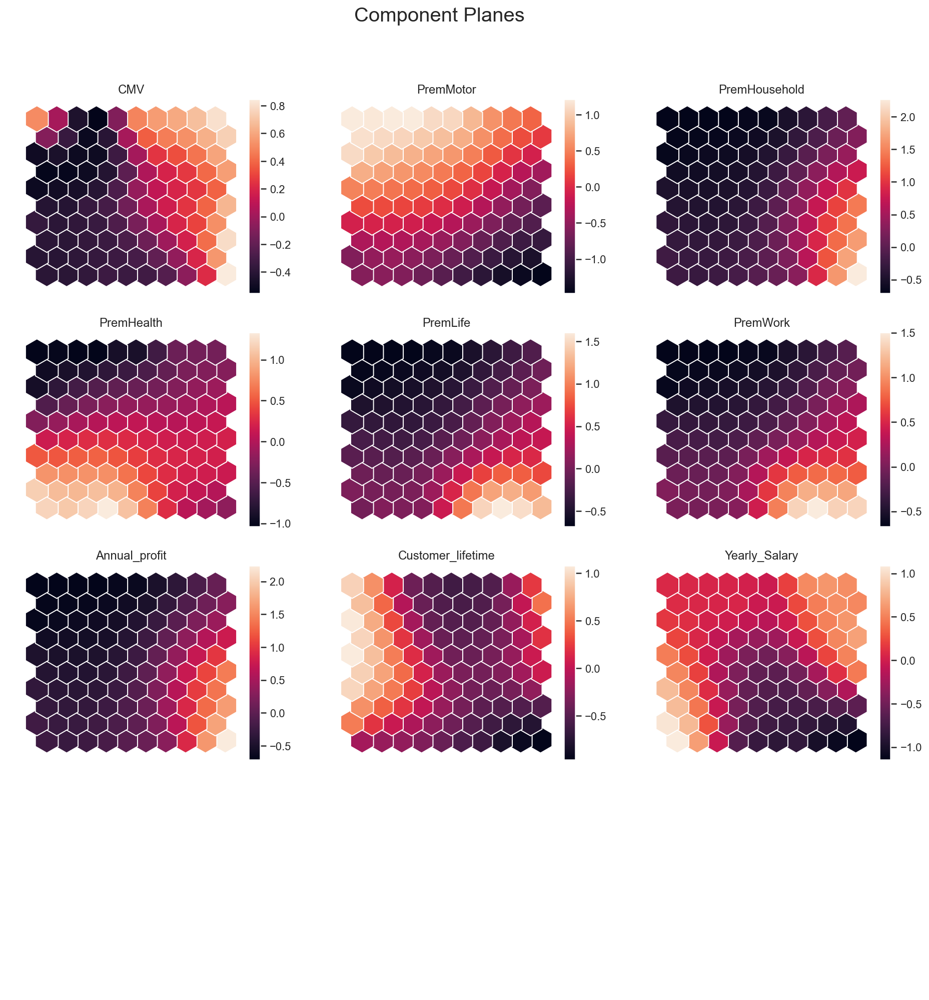

In [157]:
# Visualizing the Component planes (feature values)
sns.set()
view2D = View2D(12, 12, "", text_size=10)
view2D.show(sm1, col_sz=3, what='codebook')
plt.subplots_adjust(top=0.90)
plt.suptitle("Component Planes", fontsize=20)
plt.show()

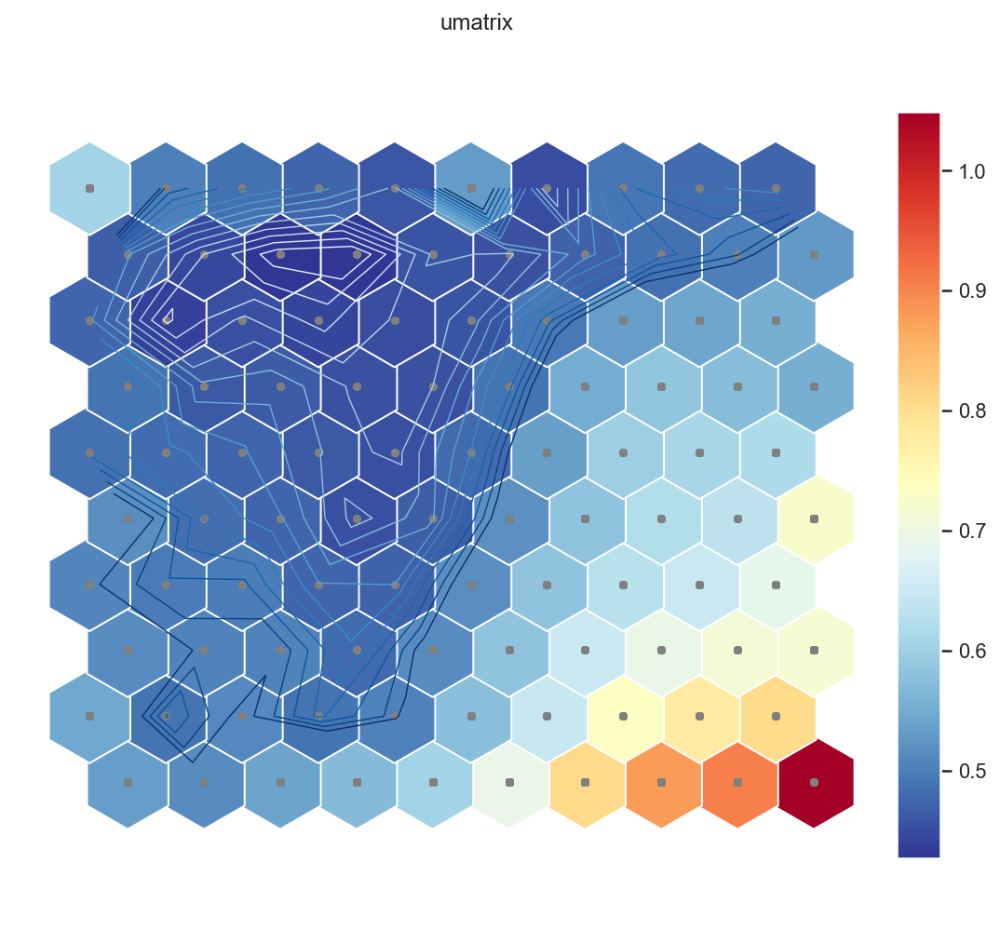

array([[0.60442662, 0.49982829, 0.4853156 , 0.47490715, 0.45994536,
        0.53243659, 0.44969538, 0.49177193, 0.48051058, 0.47422108],
       [0.46760446, 0.44393611, 0.42837516, 0.42675161, 0.45655962,
        0.45452809, 0.47048635, 0.48722174, 0.50069535, 0.5300075 ],
       [0.47410411, 0.43699795, 0.45122108, 0.44191977, 0.45035594,
        0.45748026, 0.49276548, 0.53493082, 0.54405197, 0.55371522],
       [0.48981104, 0.46282042, 0.46438815, 0.4539899 , 0.45537123,
        0.48752258, 0.55264059, 0.58525486, 0.57430652, 0.55338145],
       [0.48731852, 0.4803012 , 0.47351876, 0.46172034, 0.45293054,
        0.47847312, 0.53643017, 0.59761466, 0.61031381, 0.61825596],
       [0.51904064, 0.4839607 , 0.47341334, 0.45268608, 0.46602025,
        0.51946745, 0.58353523, 0.6221314 , 0.63323442, 0.72544086],
       [0.50869205, 0.49685856, 0.49737122, 0.47303984, 0.47255868,
        0.51858914, 0.58335625, 0.63020553, 0.64889904, 0.68937882],
       [0.51611536, 0.50560151, 0.5050690

In [158]:
# Here you have U-matrix
u = sompy.umatrix.UMatrixView(9, 9, 'umatrix', show_axis=True, text_size=8, show_text=True)

UMAT = u.show(
    sm1, 
    distance=2, 
    row_normalized=False,
    show_data=True, 
    contour=True, # Visualize isomorphic curves
    blob=False
)

np.flip(UMAT[1], axis=1) # U-matrix values - they match with the plot colors

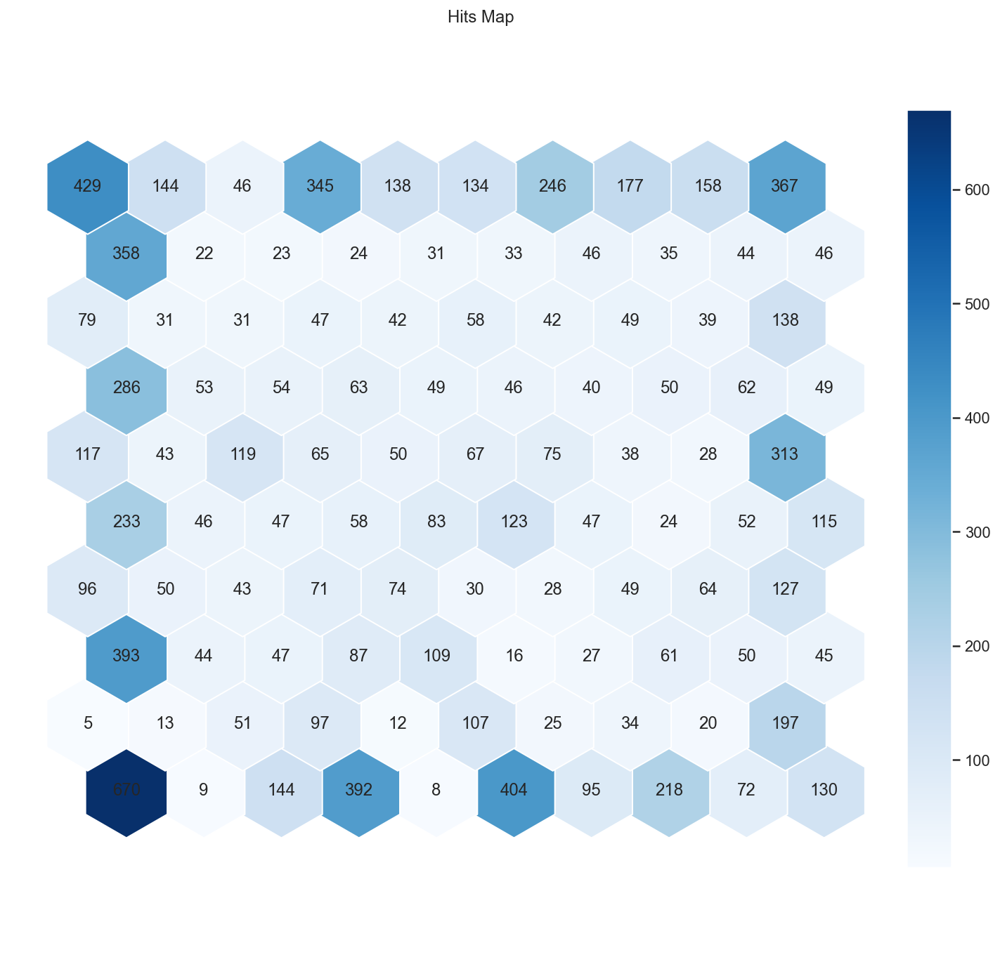

In [159]:
vhts  = BmuHitsView(12,12,"Hits Map")
vhts.show(sm1, anotate=True, onlyzeros=False, labelsize=12, cmap="Blues")
plt.show()

<a class="anchor" id="A.t">
    
### Self Organizing Maps + Kmeans

In [302]:
# This som implementation does not have a random seed parameter
# We're going to set it up ourselves
np.random.seed(42)

# Notice that the SOM did not converge - We're under a time constraint for this class
sm = sompy.SOMFactory().build(
    data_normalized[metric_features].values, 
    mapsize=[50, 50],  # NEEDS TO BE A LIST
    initialization='random',
    neighborhood='gaussian',
    training='batch',
    lattice='hexa',
    component_names=metric_features
)
sm.train(n_job=-1, verbose='info', train_rough_len=100, train_finetune_len=100)

 Training...
 random_initialization took: 0.001000 seconds
 Rough training...
 radius_ini: 17.000000 , radius_final: 2.833333, trainlen: 100

 epoch: 1 ---> elapsed time:  0.184000, quantization error: 2.176420

 epoch: 2 ---> elapsed time:  0.223000, quantization error: 2.782592

 epoch: 3 ---> elapsed time:  0.217000, quantization error: 2.736135

 epoch: 4 ---> elapsed time:  0.221000, quantization error: 2.728659

 epoch: 5 ---> elapsed time:  0.223000, quantization error: 2.723844

 epoch: 6 ---> elapsed time:  0.231000, quantization error: 2.717849

 epoch: 7 ---> elapsed time:  0.234000, quantization error: 2.714090

 epoch: 8 ---> elapsed time:  0.229000, quantization error: 2.712082

 epoch: 9 ---> elapsed time:  0.228000, quantization error: 2.710655

 epoch: 10 ---> elapsed time:  0.228000, quantization error: 2.709222

 epoch: 11 ---> elapsed time:  0.226000, quantization error: 2.707472

 epoch: 12 ---> elapsed time:  0.233000, quantization error: 2.705195

 epoch: 13 --->

 epoch: 14 ---> elapsed time:  0.337000, quantization error: 2.040468

 epoch: 15 ---> elapsed time:  0.410000, quantization error: 2.033823

 epoch: 16 ---> elapsed time:  0.253000, quantization error: 2.027044

 epoch: 17 ---> elapsed time:  0.358000, quantization error: 2.020218

 epoch: 18 ---> elapsed time:  0.257000, quantization error: 2.013285

 epoch: 19 ---> elapsed time:  0.256000, quantization error: 2.006266

 epoch: 20 ---> elapsed time:  0.283000, quantization error: 1.999080

 epoch: 21 ---> elapsed time:  0.314000, quantization error: 1.991733

 epoch: 22 ---> elapsed time:  0.301000, quantization error: 1.984376

 epoch: 23 ---> elapsed time:  0.256000, quantization error: 1.976930

 epoch: 24 ---> elapsed time:  0.247000, quantization error: 1.969396

 epoch: 25 ---> elapsed time:  0.247000, quantization error: 1.961730

 epoch: 26 ---> elapsed time:  0.275000, quantization error: 1.954138

 epoch: 27 ---> elapsed time:  0.258000, quantization error: 1.946457

 epoch

In [303]:
# Coordinates of the units in the input space
sm.codebook.matrix

array([[ 2.497585e+00, -1.639837e+00,  2.874573e+00, ...,  2.840059e+00,
        -1.167402e+00, -1.290616e+00],
       [ 1.799380e+00, -1.671567e+00,  2.893274e+00, ...,  2.861994e+00,
        -1.170140e+00, -1.381619e+00],
       [ 7.534150e-01, -1.708279e+00,  3.090571e+00, ...,  3.057513e+00,
        -1.198421e+00, -1.425491e+00],
       ...,
       [ 1.106713e+00,  1.565495e+00, -7.865880e-01, ..., -7.777840e-01,
         1.446351e+00, -8.270000e-04],
       [ 1.060808e+00,  1.499348e+00, -7.920470e-01, ..., -7.897920e-01,
         1.537277e+00,  2.364550e-01],
       [ 1.022132e+00,  1.433660e+00, -7.974030e-01, ..., -7.966080e-01,
         1.530034e+00,  4.638490e-01]])

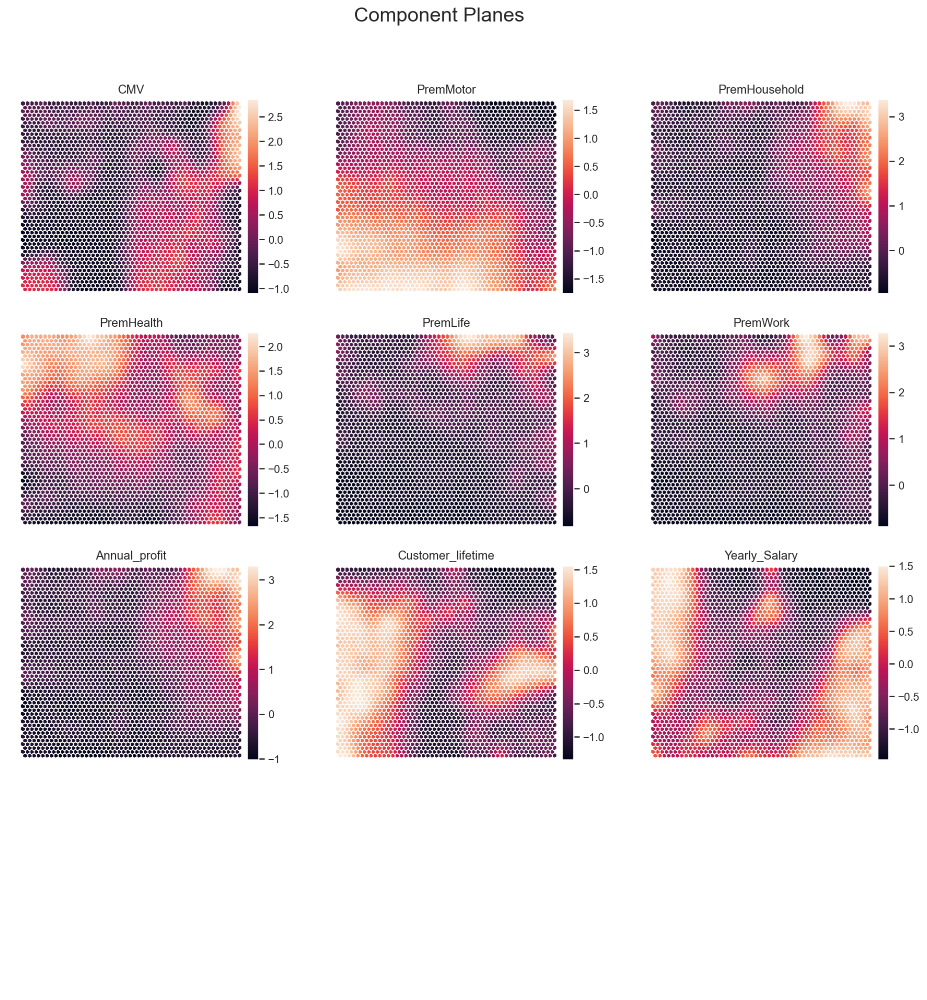

In [304]:
# Component planes on the 50x50 grid
sns.set()
view2D = View2D(12,12,"", text_size=10)
view2D.show(sm, col_sz=3, what='codebook')
plt.subplots_adjust(top=0.90)
plt.suptitle("Component Planes", fontsize=20)
plt.show()

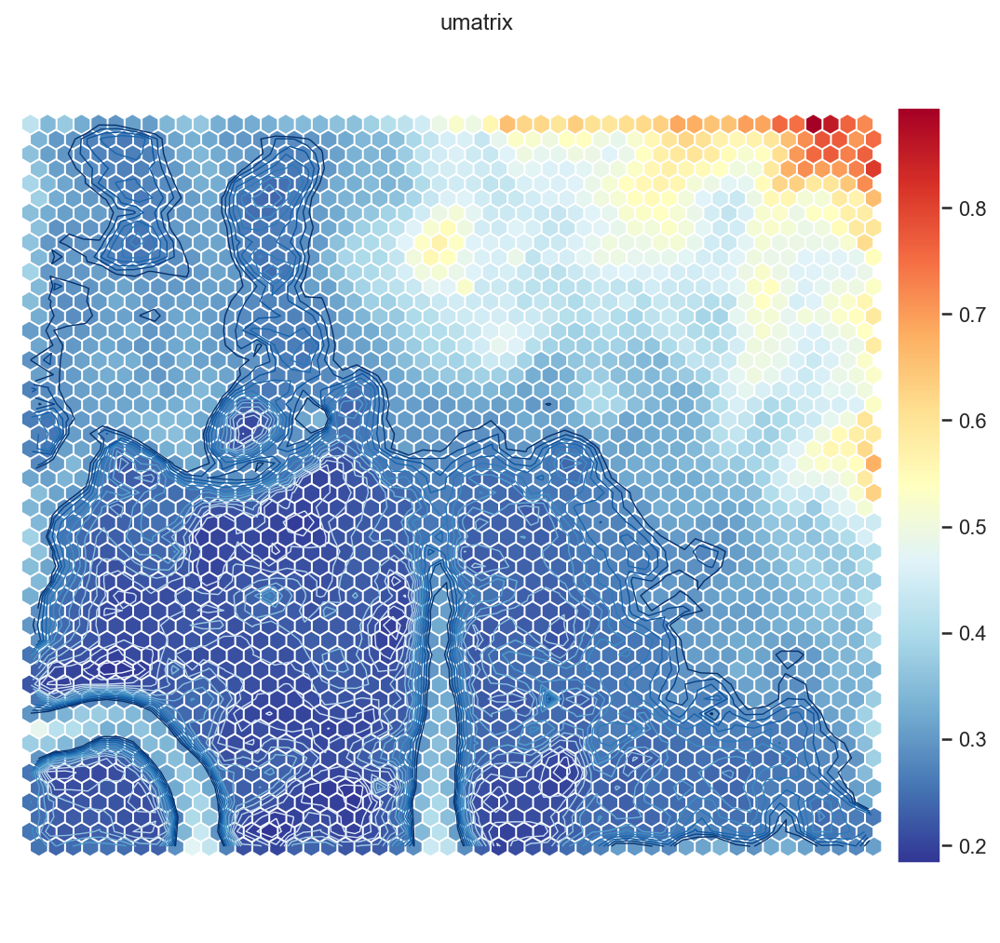

In [305]:
# U-matrix of the 50x50 grid
u = sompy.umatrix.UMatrixView(9, 9, 'umatrix', show_axis=True, text_size=8, show_text=True)

UMAT = u.show(
    sm, 
    distance=2, 
    row_normalized=False, 
    show_data=False, 
    contour=True # Visualize isomorphic curves
)

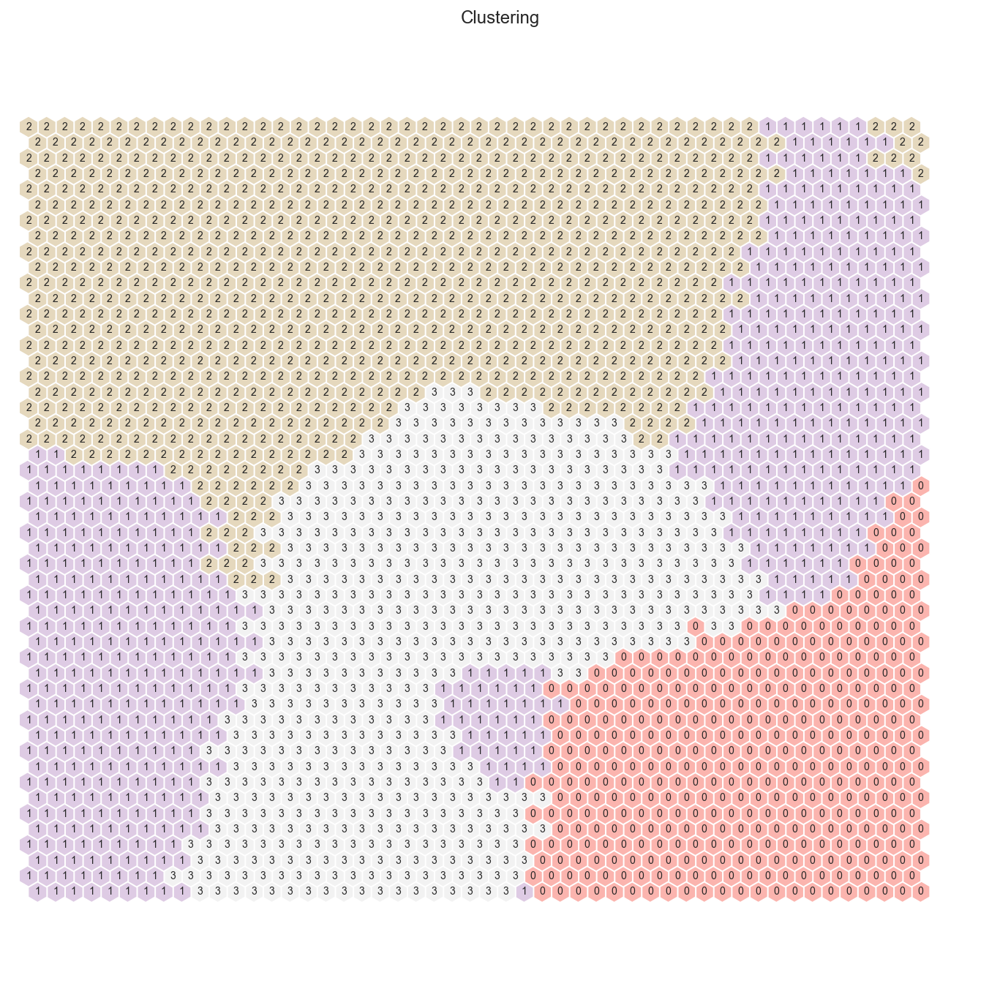

In [306]:
# Perform K-Means clustering on top of the 2500 untis (sm.get_node_vectors() output)
kmeans = KMeans(n_clusters=4, init='k-means++', n_init=20, random_state=42)
nodeclus_labels = kmeans.fit_predict(sm.codebook.matrix)
sm.cluster_labels = nodeclus_labels  # setting the cluster labels of sompy

hits = HitMapView(12, 12,"Clustering", text_size=10)
hits.show(sm, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")

plt.show()

In [166]:
# Check the nodes and and respective clusters
nodes = sm.codebook.matrix

df_nodes = pd.DataFrame(nodes, columns=metric_features)
df_nodes['label'] = nodeclus_labels
df_nodes

,CMV,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Annual_profit,Customer_lifetime,Yearly_Salary,label
0,2.497585,-1.639837,2.874573,-0.412589,0.131694,2.875805,2.840059,-1.167402,-1.290616,0
1,1.799380,-1.671567,2.893274,-0.404103,0.240767,2.845643,2.861994,-1.170140,-1.381619,0
2,0.753415,-1.708279,3.090571,-0.514012,0.414664,2.779060,3.057513,-1.198421,-1.425491,0
3,-0.237211,-1.737001,3.335884,-0.562356,0.432309,2.684058,3.298620,-1.209612,-1.450355,0
4,-0.437967,-1.683205,3.363566,-0.480472,0.850954,1.874420,3.315818,-1.160422,-1.412265,0
...,...,...,...,...,...,...,...,...,...,...
2495,1.110576,1.608294,-0.804744,-1.525129,-0.814459,-0.771205,-0.788967,0.905611,-0.156749,2
2496,1.109015,1.600103,-0.810821,-1.507394,-0.823540,-0.787471,-0.801374,1.219319,-0.152912,2
2497,1.106713,1.565495,-0.786588,-1.473418,-0.798857,-0.788053,-0.777784,1.446351,-0.000827,2
2498,1.060808,1.499348,-0.792047,-1.403192,-0.766546,-0.756006,-0.789792,1.537277,0.236455,2


In [167]:
# Obtaining SOM's BMUs labels
bmus_map = sm.find_bmu(data_normalized[metric_features])[0]  # get bmus for each observation in df

df_bmus = pd.DataFrame(
    np.concatenate((data_normalized[metric_features], np.expand_dims(bmus_map,1)), axis=1),
    index=data_normalized[metric_features].index, columns=np.append(data_normalized[metric_features].columns,"BMU")
)
df_bmus

,CMV,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Annual_profit,Customer_lifetime,Yearly_Salary,BMU
Customer_id,,,,,,,,,,
1,0.487277,0.644732,0.117631,0.353997,0.211580,0.110482,0.213474,0.592593,0.393345,1557.0
2,0.170223,0.138411,0.374105,0.283255,0.789282,0.451757,0.421896,0.222222,0.073379,1604.0
3,0.563863,0.356778,0.228104,0.302067,0.365691,0.424567,0.277207,0.370370,0.414676,1606.0
4,0.240890,0.316614,0.090137,0.746954,0.165864,0.154270,0.158370,0.407407,0.163396,1260.0
5,0.273220,0.581559,0.093526,0.440381,0.100991,0.204406,0.182627,0.555556,0.305034,1557.0
...,...,...,...,...,...,...,...,...,...,...
10291,0.360536,0.018665,0.726200,0.250924,0.470169,0.815557,0.754692,0.074074,0.062500,669.0
10292,0.251340,0.675089,0.094783,0.419446,0.065734,0.102413,0.193090,0.629630,0.609002,1557.0
10294,0.575892,0.691870,0.158264,0.344198,0.077056,0.064591,0.239531,0.259259,0.551408,1658.0


In [168]:
# Get cluster labels for each observation
df_final = df_bmus.merge(df_nodes['label'], 'left', left_on="BMU", right_index=True)
df_final

,CMV,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Annual_profit,Customer_lifetime,Yearly_Salary,BMU,label
Customer_id,,,,,,,,,,,
1,0.487277,0.644732,0.117631,0.353997,0.211580,0.110482,0.213474,0.592593,0.393345,1557.0,0
2,0.170223,0.138411,0.374105,0.283255,0.789282,0.451757,0.421896,0.222222,0.073379,1604.0,1
3,0.563863,0.356778,0.228104,0.302067,0.365691,0.424567,0.277207,0.370370,0.414676,1606.0,0
4,0.240890,0.316614,0.090137,0.746954,0.165864,0.154270,0.158370,0.407407,0.163396,1260.0,1
5,0.273220,0.581559,0.093526,0.440381,0.100991,0.204406,0.182627,0.555556,0.305034,1557.0,0
...,...,...,...,...,...,...,...,...,...,...,...
10291,0.360536,0.018665,0.726200,0.250924,0.470169,0.815557,0.754692,0.074074,0.062500,669.0,0
10292,0.251340,0.675089,0.094783,0.419446,0.065734,0.102413,0.193090,0.629630,0.609002,1557.0,0
10294,0.575892,0.691870,0.158264,0.344198,0.077056,0.064591,0.239531,0.259259,0.551408,1658.0,1


In [169]:
# Characterizing the final clusters
df_final.drop(columns='BMU').groupby('label').mean()

,CMV,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Annual_profit,Customer_lifetime,Yearly_Salary
label,,,,,,,,,
0,0.386829,0.514200,0.208210,0.412414,0.187605,0.191831,0.282825,0.563099,0.521000
1,0.380542,0.523868,0.212465,0.393739,0.176701,0.200767,0.285377,0.379732,0.364637
2,0.531749,0.902456,0.038565,0.133466,0.031776,0.052753,0.123941,0.566138,0.292540
3,0.270813,0.119049,0.116933,0.437400,0.412563,0.798310,0.175618,0.179012,0.130973


In [170]:
# using R²
def get_ss(df):
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # return sum of sum of squares of each df variable

sst = get_ss(df_final[metric_features])  # get total sum of squares
ssw_labels = df_final[metric_features.to_list() + ["label"]].groupby(by='label').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
r2

0.04589661679366799

Low R²

<a class="anchor" id="A.t">
    
### Density base clustering

#### Mean Shift Clustering

In [171]:
# The following bandwidth can be automatically detected using (we need to set quantile though)
# Based on distance to nearest neighbors for all observations
bandwidth = estimate_bandwidth(data_normalized[metric_features], quantile=0.06, random_state=1, n_jobs=-1)
bandwidth

0.4132429369444096

In [172]:
# Perform mean-shift clustering with bandwidth set using estimate_bandwidth
ms = MeanShift(bandwidth=bandwidth, bin_seeding=True, n_jobs=4)
ms_labels = ms.fit_predict(data_normalized[metric_features])

ms_n_clusters = len(np.unique(ms_labels))
print("Number of estimated clusters : %d" % ms_n_clusters)

Number of estimated clusters : 5


In [175]:
# Concatenating the labels to df
df_concat = pd.concat([data_normalized[metric_features], pd.Series(ms_labels, index=data_normalized[metric_features].index, name="ms_labels")], axis=1)
df_concat.head()

,CMV,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Annual_profit,Customer_lifetime,Yearly_Salary,ms_labels
Customer_id,,,,,,,,,,
1,0.487277,0.644732,0.117631,0.353997,0.211580,0.110482,0.213474,0.592593,0.393345,0
2,0.170223,0.138411,0.374105,0.283255,0.789282,0.451757,0.421896,0.222222,0.073379,3
3,0.563863,0.356778,0.228104,0.302067,0.365691,0.424567,0.277207,0.370370,0.414676,0
4,0.240890,0.316614,0.090137,0.746954,0.165864,0.154270,0.158370,0.407407,0.163396,0
5,0.273220,0.581559,0.093526,0.440381,0.100991,0.204406,0.182627,0.555556,0.305034,0


In [176]:
# Computing the R^2 of the cluster solution
sst = get_ss(data_normalized[metric_features])  # get total sum of squares
ssw_labels = df_concat.groupby(by='ms_labels').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.2613


#### Density-based spatial clustering

In [177]:
# Perform DBSCAN clustering
dbscan = DBSCAN(eps=1.9, min_samples=20, n_jobs=4)
dbscan_labels = dbscan.fit_predict(data_normalized[metric_features])

dbscan_n_clusters = len(np.unique(dbscan_labels))
print("Number of estimated clusters : %d" % dbscan_n_clusters)

Number of estimated clusters : 1


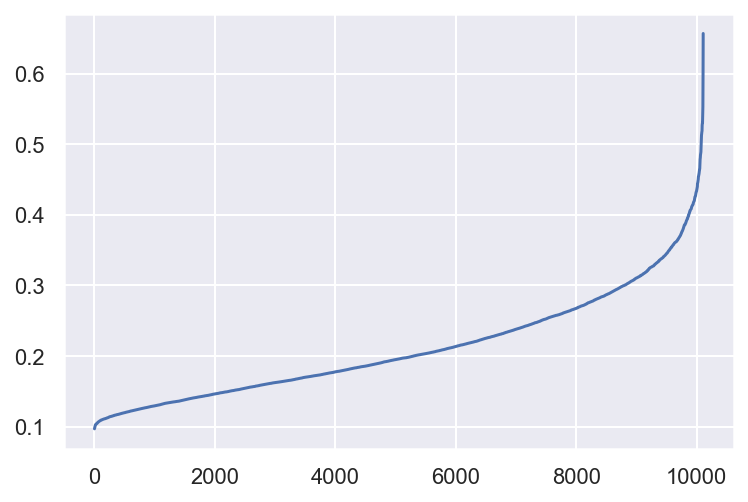

In [178]:
# K-distance graph to find out the right eps value
neigh = NearestNeighbors(n_neighbors=20)
neigh.fit(data_normalized[metric_features])
distances, _ = neigh.kneighbors(data_normalized[metric_features])
distances = np.sort(distances[:, -1])
plt.plot(distances)
plt.show()

In [180]:
# Concatenating the labels to df
df_concatdbscan = pd.concat([data_normalized[metric_features], pd.Series(dbscan_labels, index=data_normalized[metric_features].index, name="dbscan_labels")], axis=1)
df_concatdbscan.head()

,CMV,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Annual_profit,Customer_lifetime,Yearly_Salary,dbscan_labels
Customer_id,,,,,,,,,,
1,0.487277,0.644732,0.117631,0.353997,0.211580,0.110482,0.213474,0.592593,0.393345,0
2,0.170223,0.138411,0.374105,0.283255,0.789282,0.451757,0.421896,0.222222,0.073379,0
3,0.563863,0.356778,0.228104,0.302067,0.365691,0.424567,0.277207,0.370370,0.414676,0
4,0.240890,0.316614,0.090137,0.746954,0.165864,0.154270,0.158370,0.407407,0.163396,0
5,0.273220,0.581559,0.093526,0.440381,0.100991,0.204406,0.182627,0.555556,0.305034,0


In [181]:
# Detecting noise (potential outliers)
df_concatdbscan.loc[df_concatdbscan['dbscan_labels'] == -1]

,CMV,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Annual_profit,Customer_lifetime,Yearly_Salary,dbscan_labels
Customer_id,,,,,,,,,,


In [185]:
# Computing the R^2 of the cluster solution
df_nonoise = df_concatdbscan.loc[df_concatdbscan['dbscan_labels'] != -1]
sst_dbscan = get_ss(data_normalized[metric_features])  # get total sum of squares
ssw_labels_dbscan = df_nonoise.groupby(by='dbscan_labels').apply(get_ss)  # compute ssw for each cluster labels
ssb_dbscan = sst_dbscan - np.sum(ssw_labels_dbscan)  # remember: SST = SSW + SSB
r2 = ssb_dbscan / sst_dbscan
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.0000


#### GMM : Gaussian Mixture Model 

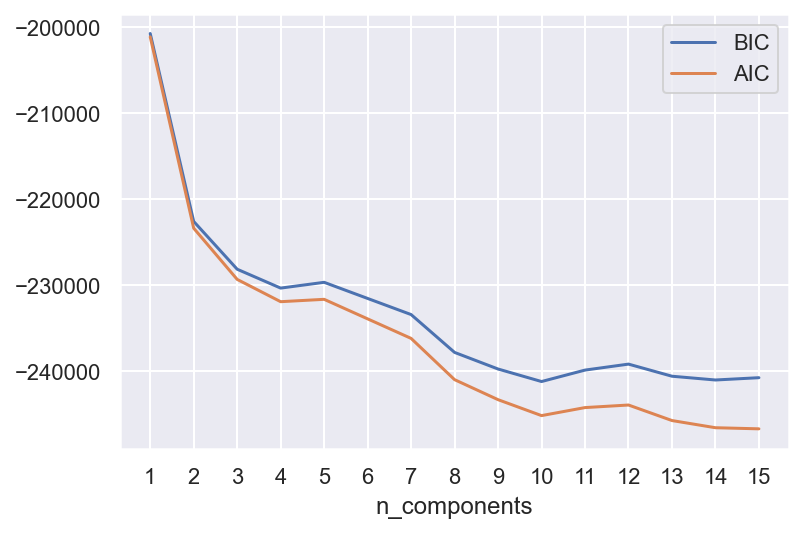

In [190]:
# Selecting number of components based on AIC and BIC
n_components = np.arange(1, 16)
models = [GaussianMixture(n, covariance_type='full', n_init=10, random_state=1).fit(data_normalized[metric_features])
          for n in n_components]

bic_values = [m.bic(data_normalized[metric_features]) for m in models]
aic_values = [m.aic(data_normalized[metric_features]) for m in models]
plt.plot(n_components, bic_values, label='BIC')
plt.plot(n_components, aic_values, label='AIC')
plt.legend(loc='best')
plt.xlabel('n_components')
plt.xticks(n_components)
plt.show()

In [192]:
# Performing GMM clustering
gmm = GaussianMixture(n_components=3, covariance_type='full', n_init=10, init_params='kmeans', random_state=1)
gmm_labels = gmm.fit_predict(data_normalized[metric_features])

In [193]:
# Concatenating the labels to df
df_concatGMM = pd.concat([data_normalized[metric_features], pd.Series(gmm_labels, index=data_normalized[metric_features].index, name="gmm_labels")], axis=1)
df_concatGMM.head()

,CMV,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Annual_profit,Customer_lifetime,Yearly_Salary,gmm_labels
Customer_id,,,,,,,,,,
1,0.487277,0.644732,0.117631,0.353997,0.211580,0.110482,0.213474,0.592593,0.393345,2
2,0.170223,0.138411,0.374105,0.283255,0.789282,0.451757,0.421896,0.222222,0.073379,1
3,0.563863,0.356778,0.228104,0.302067,0.365691,0.424567,0.277207,0.370370,0.414676,1
4,0.240890,0.316614,0.090137,0.746954,0.165864,0.154270,0.158370,0.407407,0.163396,2
5,0.273220,0.581559,0.093526,0.440381,0.100991,0.204406,0.182627,0.555556,0.305034,0


In [194]:
# Computing the R^2 of the cluster solution
sst_gmm = get_ss(data_normalized[metric_features])  # get total sum of squares
ssw_labels_gmm = df_concatGMM.groupby(by='gmm_labels').apply(get_ss)  # compute ssw for each cluster labels
ssb_gmm = sst_gmm - np.sum(ssw_labels_gmm)  # remember: SST = SSW + SSB
r2_gmm = ssb_gmm / sst_gmm
print("Cluster solution with R^2 of %0.4f" % r2_gmm)

Cluster solution with R^2 of 0.3284


Better R squared than the meanshift and dbscan